In [96]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from scipy.interpolate import griddata

In [127]:
sheet_names = [n for n in excel_file.sheet_names if n[:3]in ['Nov','Dec','Apr']] 

In [97]:
excel_file = pd.ExcelFile('_imports/Wasaga CS5 bundle data_raw_Uwe_mod.xlsx')
sheet_names = [n for n in excel_file.sheet_names if n[:3]in ['Nov','Dec','Apr']] 


raw_data = {}

for sheet in sheet_names:
    df0 = pd.read_excel('_imports/Wasaga CS5 bundle data_raw_Uwe_mod.xlsx',
                                    sheet_name=sheet,header=0,skiprows=[1])
    #df0.columns = df0.columns.map('|'.join).str.strip('|')
    df0 = df0[~df0['Sample'].isna()]
    df0 = df0[~df0['x'].isna()]
    raw_data[sheet] = df0

In [98]:
raw_data.keys()

dict_keys(['Nov_BT1', 'Dec_BT1', 'Apr_BT1', 'Nov_BT2', 'Dec_BT2', 'Apr_BT2', 'Nov_BT3', 'Dec_BT3', 'Apr_BT3'])

In [99]:
np.array([i for i in raw_data['Nov_BT1'].columns if  not i.startswith('Un')])

array(['Sample', 'Date', 'Sample.1', 'x', 'y', 'SRP', 'SRP dilution',
       'NH4-N', 'NH4 dilution', 'F', 'Cl', 'NO2', 'Br', 'SO4', 'NO3',
       'PO4', 'Acesulfame', 'Saccharin', 'Cyclamate', 'Sucralose',
       'Perchlorate', 'Glyphosate', '2,4-D ', 'Fosamine', 'MCPA',
       'Picloram', 'd2H (‰)', 'd18O (‰)'], dtype='<U12')

## Integrate whole cross section

In [23]:
contour_dict = {}
for parm in ['SRP', 'NH4-N','Cl','NO3','SO4','Acesulfame']:
    # vmin = np.nanmin([np.nanmin(raw_data[key][parm]) for key in raw_data.keys()])
    # vmin = 0
    # vmax = np.nanpercentile([np.nanmax(raw_data[key][parm]) for key in raw_data.keys()],100)

    grid_zs ={}
    contour_dict[parm] = grid_zs
    #fig,axes = plt.subplots(3,3)
    # n = 0
    for sheet in sheet_names:
        df1 = raw_data[sheet].copy()
        df1 = df1[~df1[parm].isna()]
        xs = df1['x']
        ys = df1['y']
        zs = df1[parm]
        grid_x, grid_y = np.meshgrid(np.linspace(0, 60, 120), np.linspace(-3,0, 60))

        # Perform the kriging interpolation
        grid_z = griddata((xs, ys), zs, (grid_x, grid_y), method='linear')
        grid_zs[sheet] = grid_z



grid_zs = {}
contour_dict['SRP - NH4-N']  = grid_zs
for key in contour_dict['SRP'].keys():
    grid_zs[key]= contour_dict['SRP'][key] - contour_dict['NH4-N'][key]*200

/var/folders/hy/v14_l_r91tl2w5s9xfm9p2kc0000gn/T/ipykernel_28582/938420884.py:40: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


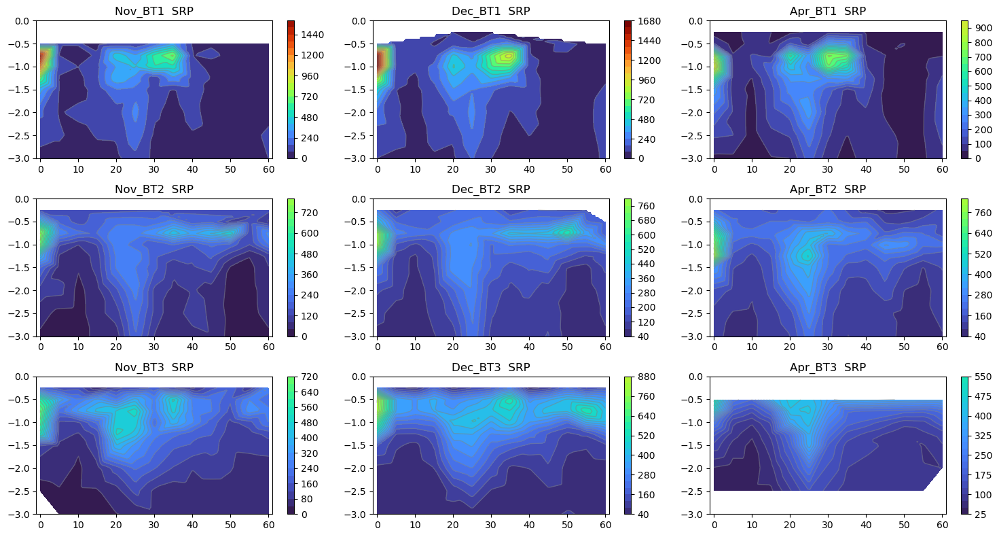

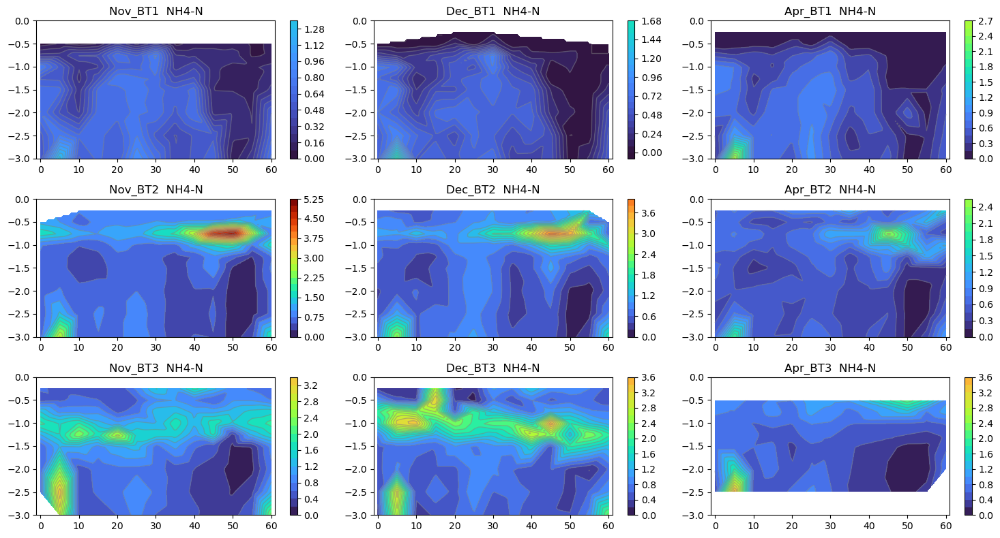

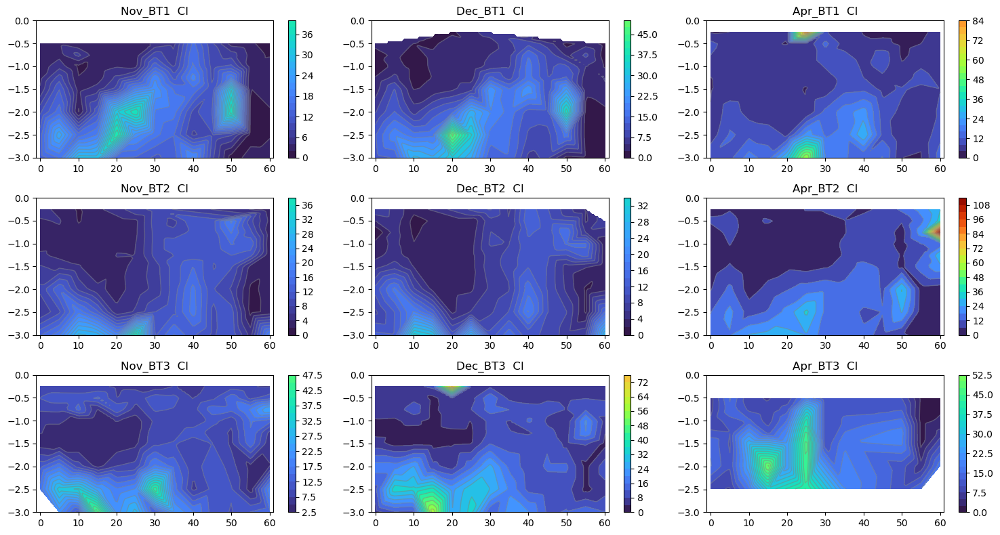

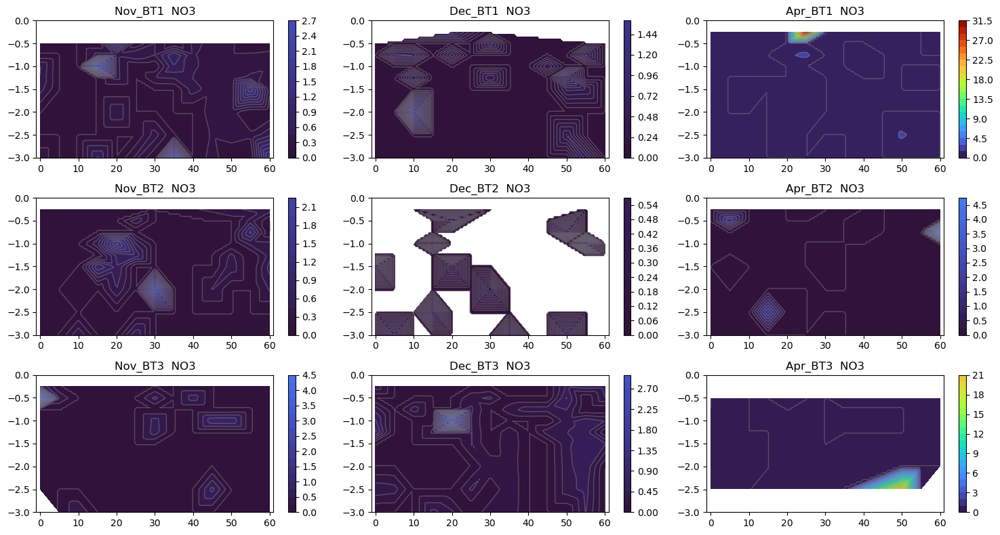

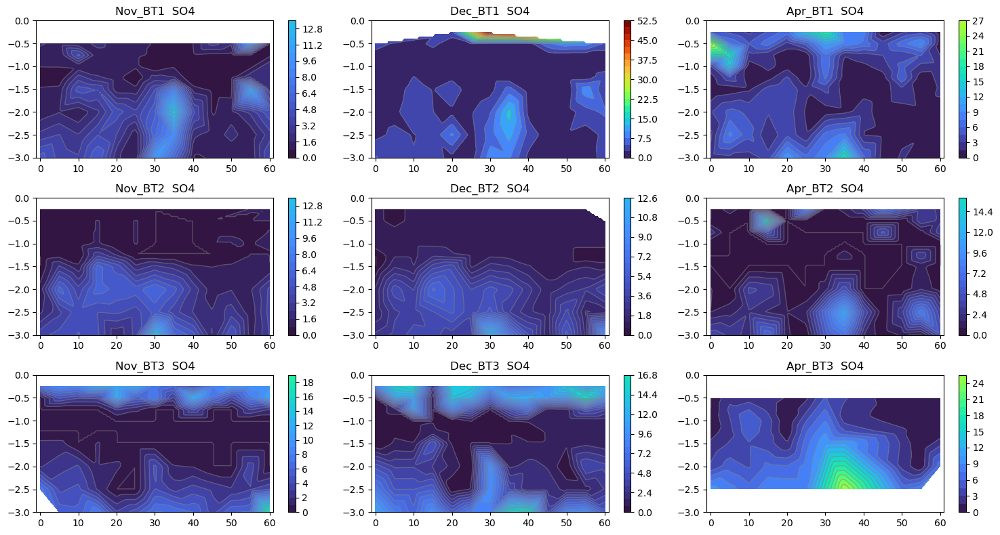

In [10]:



for parm in ['SRP', 'NH4-N','Cl','NO3','SO4']:
    n = 0
    vmin = np.nanmin([np.nanmin(raw_data[key][parm]) for key in raw_data.keys()])
    vmin = 0
    vmax = np.nanpercentile([np.nanmax(raw_data[key][parm]) for key in raw_data.keys()],100)

    fig,axes = plt.subplots(3,3)

    for sheet in sheet_names:


        grid_x, grid_y = np.meshgrid(np.linspace(0, 60, 120), np.linspace(-3,0, 60))

        # Perform the kriging interpolation
        grid_z = contour_dict[parm][sheet]
        #grid_zs[sheet] = grid_z


        # Plot the interpolated surface
        ax = axes.flatten()[n]
        n+=1
        #print(vmin,vmax)
        contour = ax.contourf(grid_x, grid_y, grid_z, cmap='turbo',levels=20,vmin=vmin,vmax=vmax)
        contour.set_clim(vmin,vmax)

        ax.contour(grid_x, grid_y, grid_z, levels=20, colors='grey', linewidths=1,alpha=0.5)
        ax.scatter(xs, ys, c=zs, cmap='coolwarm', edgecolors='k',s=6,vmin=vmin,vmax=vmax)
        
        #plt.colorbar()
        
        ax.set_ylim(-3.0,0)
        ax.set_xlim(-1,61)
        fig.colorbar(contour,ax=ax)

        ax.set_title('{}  {}'.format(sheet,parm))

    
    fig.set_size_inches(15,8)
    fig.tight_layout()
    fig.show()

    ##---------------------------------------

    

/var/folders/hy/v14_l_r91tl2w5s9xfm9p2kc0000gn/T/ipykernel_87687/3370617487.py:71: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig2.show()


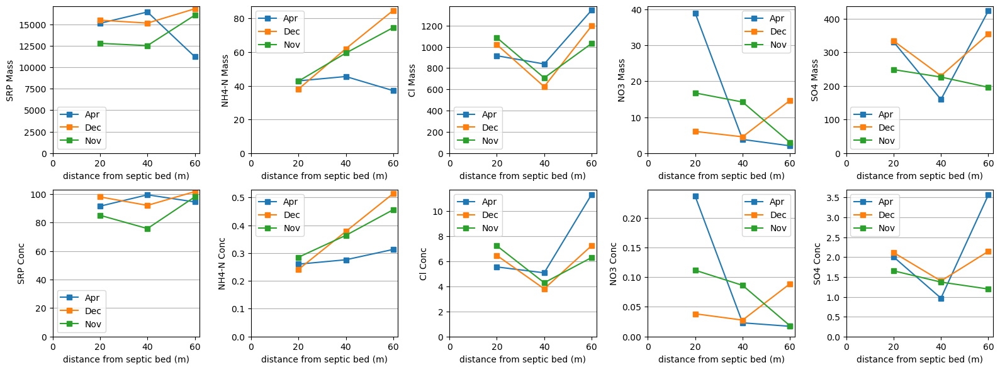

In [ ]:
import numpy as np
from scipy.interpolate import griddata
import matplotlib.pyplot as plt

fig2 ,ax2 = plt.subplots(2,5)
n2 = 0


for parm in ['SRP', 'NH4-N','Cl','NO3','SO4']:

    grid_zs = contour_dict[parm]
    ##-----------------------mass----------------
    ax = ax2.flatten()[n2]

    for month in ['Apr','Dec','Nov']:
        grid_z = grid_zs['{}_BT1'.format(month)]
        y1 = np.nansum(grid_z[:,20:80]*0.025)

        grid_z = grid_zs['{}_BT2'.format(month)]
        y2 = np.nansum(grid_z[:,20:80]*0.025)

        grid_z = grid_zs['{}_BT3'.format(month)]
        y3 = np.nansum(grid_z[:,20:80]*0.025)

        ax.plot([20,40,60],[y1,y2,y3],marker='s',label=month)
    ax.set_ylim(0)
    ax.set_xlim(0)
    ax.grid(axis='y')
    ax.legend()
    
    ax.set_xlabel('distance from septic bed (m)')
    ax.set_ylabel('{} Mass'.format(parm))

    ## ---------- Concentration ----------
    ax = ax2.flatten()[n2+5]
    #n2 +=1

    for month in ['Apr','Dec','Nov']:
        grid_z = grid_zs['{}_BT1'.format(month)]
        area = len(grid_z[~np.isnan(grid_z)])*0.025
        #print(area)
        y1 = np.nansum(grid_z[:,20:80]*0.025)/area
        

        
        grid_z = grid_zs['{}_BT2'.format(month)]
        area = len(grid_z[~np.isnan(grid_z)])*0.025
        #print(area)
        y2 = np.nansum(grid_z[:,20:80]*0.025)/area


        
        grid_z = grid_zs['{}_BT3'.format(month)]
        area = len(grid_z[~np.isnan(grid_z)])*0.025
        #print(area)
        y3 = np.nansum(grid_z[:,20:80]*0.025)/area

        ax.plot([20,40,60],[y1,y2,y3],marker='s',label=month)
    ax.set_ylim(0)
    ax.set_xlim(0)
    ax.grid(axis='y')
    ax.legend()
    
    ax.set_xlabel('distance from septic bed (m)')
    ax.set_ylabel('{} Conc'.format(parm))
    n2 +=1


fig2.set_size_inches(16,6)
fig2.tight_layout()
fig2.show()
    

/var/folders/hy/v14_l_r91tl2w5s9xfm9p2kc0000gn/T/ipykernel_28582/3441066695.py:41: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


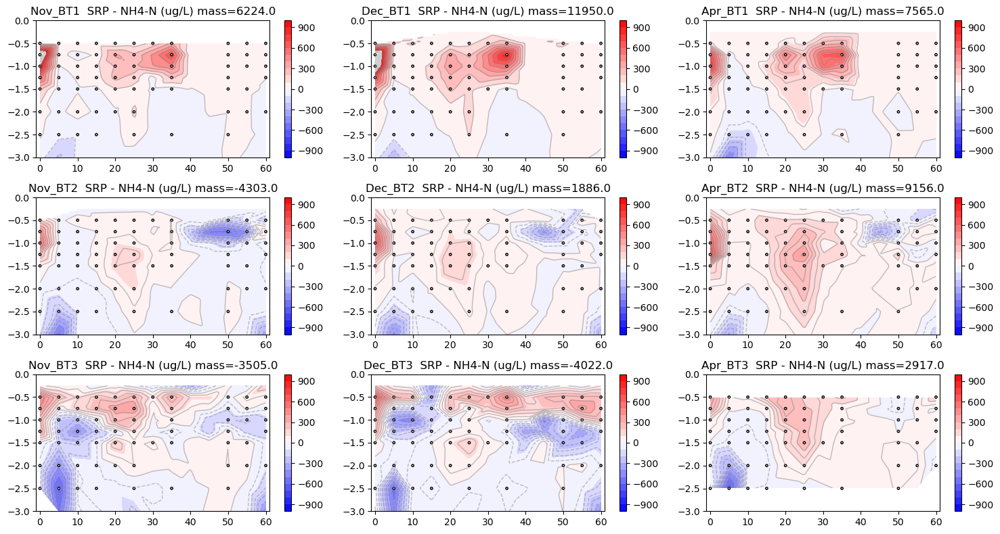

In [24]:
for parm in ['SRP - NH4-N']:
    #vmin = np.nanmin([np.nanmin(raw_data[key][parm]) for key in raw_data.keys()])
    vmin = -1000
    vmax =1000


    fig,axes = plt.subplots(3,3)
    n = 0
    for sheet in sheet_names:

        grid_x, grid_y = np.meshgrid(np.linspace(0, 60, 120), np.linspace(-3,0, 60))

        # Perform the kriging interpolation
        grid_z = contour_dict[parm][sheet]


        # Plot the interpolated surface
        ax = axes.flatten()[n]
        n+=1
        #print(vmin,vmax)
        contour = ax.contourf(grid_x, grid_y, grid_z, cmap='bwr',levels=np.linspace(vmin,vmax,20+1),vmin=vmin,vmax=vmax)
        contour.set_clim(vmin,vmax)
        

        ax.contour(grid_x, grid_y, grid_z, levels=20, colors='grey', linewidths=1,alpha=0.5)
        ax.scatter(xs, ys, c=zs, cmap='coolwarm', edgecolors='k',s=6,vmin=vmin,vmax=vmax)
        
        #plt.colorbar()
        
        ax.set_ylim(-3.0,0)
        ax.set_xlim(-1,61)
        
        plt.colorbar(contour,ax=ax,extend='neither')
        
        mass = round(np.nansum(grid_z)*0.025,0)
        ax.set_title('{}  {} (ug/L) mass={}'.format(sheet,parm,mass))

    
    fig.set_size_inches(15,8)
    fig.tight_layout()
    fig.show()

/var/folders/hy/v14_l_r91tl2w5s9xfm9p2kc0000gn/T/ipykernel_87687/1361637251.py:71: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig2.show()


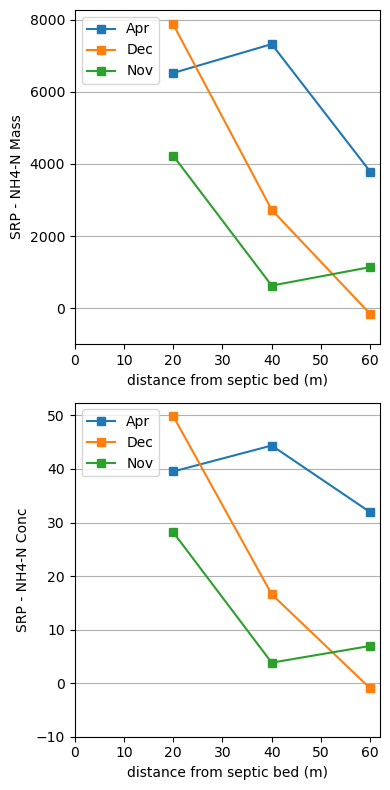

In [ ]:
import numpy as np
from scipy.interpolate import griddata
import matplotlib.pyplot as plt

fig2 ,ax2 = plt.subplots(2,1)
n2 = 0


for parm in ['SRP - NH4-N']:

    grid_zs = contour_dict[parm]
    ##-----------------------mass----------------
    ax = ax2.flatten()[n2]

    for month in ['Apr','Dec','Nov']:
        grid_z = grid_zs['{}_BT1'.format(month)]
        y1 = np.nansum(grid_z[:,20:80]*0.025)

        grid_z = grid_zs['{}_BT2'.format(month)]
        y2 = np.nansum(grid_z[:,20:80]*0.025)

        grid_z = grid_zs['{}_BT3'.format(month)]
        y3 = np.nansum(grid_z[:,20:80]*0.025)

        ax.plot([20,40,60],[y1,y2,y3],marker='s',label=month)
    ax.set_ylim(-1000)
    ax.set_xlim(0)
    ax.grid(axis='y')
    ax.legend()
    
    ax.set_xlabel('distance from septic bed (m)')
    ax.set_ylabel('{} Mass'.format(parm))

    ## ---------- Concentration ----------
    ax = ax2.flatten()[n2+1]
    #n2 +=1

    for month in ['Apr','Dec','Nov']:
        grid_z = grid_zs['{}_BT1'.format(month)]
        area = len(grid_z[~np.isnan(grid_z)])*0.025
        #print(area)
        y1 = np.nansum(grid_z[:,20:80]*0.025)/area
        

        
        grid_z = grid_zs['{}_BT2'.format(month)]
        area = len(grid_z[~np.isnan(grid_z)])*0.025
        #print(area)
        y2 = np.nansum(grid_z[:,20:80]*0.025)/area


        
        grid_z = grid_zs['{}_BT3'.format(month)]
        area = len(grid_z[~np.isnan(grid_z)])*0.025
        #print(area)
        y3 = np.nansum(grid_z[:,20:80]*0.025)/area

        ax.plot([20,40,60],[y1,y2,y3],marker='s',label=month)
    ax.set_ylim(-10)
    ax.set_xlim(0)
    ax.grid(axis='y')
    ax.legend()
    
    ax.set_xlabel('distance from septic bed (m)')
    ax.set_ylabel('{} Conc'.format(parm))
    n2 +=1


fig2.set_size_inches(4,8)
fig2.tight_layout()
fig2.show()
    

/var/folders/hy/v14_l_r91tl2w5s9xfm9p2kc0000gn/T/ipykernel_87687/3121874137.py:138: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig2.show()


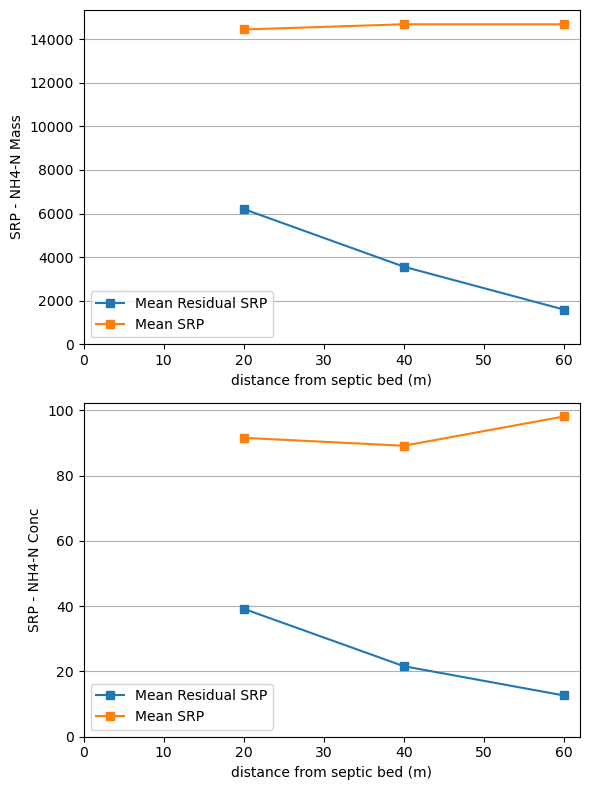

In [33]:
import numpy as np
from scipy.interpolate import griddata
import matplotlib.pyplot as plt

fig2 ,ax2 = plt.subplots(2,1)
n2 = 0


for parm in ['SRP - NH4-N']:
    y1s = []
    y2s = []
    y3s = []
    grid_zs = contour_dict[parm]
    ##-----------------------mass----------------
    ax = ax2.flatten()[n2]

    for month in ['Apr','Dec','Nov']:
        grid_z = grid_zs['{}_BT1'.format(month)]
        y1 = np.nansum(grid_z[:,20:80]*0.025)
        y1s.append(y1)

        grid_z = grid_zs['{}_BT2'.format(month)]
        y2 = np.nansum(grid_z[:,20:80]*0.025)
        y2s.append(y2)

        grid_z = grid_zs['{}_BT3'.format(month)]
        y3 = np.nansum(grid_z[:,20:80]*0.025)
        y3s.append(y3)
    ax.plot([20,40,60],[np.mean(y1s),np.mean(y2s),np.mean(y3s)],marker='s',label='Mean Residual SRP')


    grid_zs = contour_dict['SRP']
    ##-----------------------mass----------------
    y1s = []
    y2s = []
    y3s = []

    for month in ['Apr','Dec','Nov']:
        grid_z = grid_zs['{}_BT1'.format(month)]
        y1 = np.nansum(grid_z[:,20:80]*0.025)
        y1s.append(y1)

        grid_z = grid_zs['{}_BT2'.format(month)]
        y2 = np.nansum(grid_z[:,20:80]*0.025)
        y2s.append(y2)

        grid_z = grid_zs['{}_BT3'.format(month)]
        y3 = np.nansum(grid_z[:,20:80]*0.025)
        y3s.append(y3)
    ax.plot([20,40,60],[np.mean(y1s),np.mean(y2s),np.mean(y3s)],marker='s',label='Mean SRP')


    ax.set_ylim(0)
    ax.set_xlim(0)
    ax.grid(axis='y')
    ax.legend()
    
    ax.set_xlabel('distance from septic bed (m)')
    ax.set_ylabel('{} Mass'.format(parm))


    grid_zs = contour_dict[parm]
    ## ---------- Concentration ----------
    ax = ax2.flatten()[n2+1]
    #n2 +=1
    y1s = []
    y2s = []
    y3s = []
    for month in ['Apr','Dec','Nov']:
        grid_z = grid_zs['{}_BT1'.format(month)]
        area = len(grid_z[~np.isnan(grid_z)])*0.025
        #print(area)
        y1 = np.nansum(grid_z[:,20:80]*0.025)/area
        y1s.append(y1)
        

        
        grid_z = grid_zs['{}_BT2'.format(month)]
        area = len(grid_z[~np.isnan(grid_z)])*0.025
        #print(area)
        y2 = np.nansum(grid_z[:,20:80]*0.025)/area
        y2s.append(y2)


        
        grid_z = grid_zs['{}_BT3'.format(month)]
        area = len(grid_z[~np.isnan(grid_z)])*0.025
        #print(area)
        y3 = np.nansum(grid_z[:,20:80]*0.025)/area
        y3s.append(y3)


    ax.plot([20,40,60],[np.mean(y1s),np.mean(y2s),np.mean(y3s)],marker='s',label='Mean Residual SRP')

    grid_zs = contour_dict['SRP']
    ## ---------- Concentration ----------
        #n2 +=1
    y1s = []
    y2s = []
    y3s = []
    for month in ['Apr','Dec','Nov']:
        grid_z = grid_zs['{}_BT1'.format(month)]
        area = len(grid_z[~np.isnan(grid_z)])*0.025
        #print(area)
        y1 = np.nansum(grid_z[:,20:80]*0.025)/area
        y1s.append(y1)
        

        
        grid_z = grid_zs['{}_BT2'.format(month)]
        area = len(grid_z[~np.isnan(grid_z)])*0.025
        #print(area)
        y2 = np.nansum(grid_z[:,20:80]*0.025)/area
        y2s.append(y2)


        
        grid_z = grid_zs['{}_BT3'.format(month)]
        area = len(grid_z[~np.isnan(grid_z)])*0.025
        #print(area)
        y3 = np.nansum(grid_z[:,20:80]*0.025)/area
        y3s.append(y3)

    
    ax.plot([20,40,60],[np.mean(y1s),np.mean(y2s),np.mean(y3s)],marker='s',label='Mean SRP')
    ax.set_ylim(0)
    ax.set_xlim(0)
    ax.grid(axis='y')
    ax.legend()
    
    ax.set_xlabel('distance from septic bed (m)')
    ax.set_ylabel('{} Conc'.format(parm))
    n2 +=1


fig2.set_size_inches(6,8)
fig2.tight_layout()
fig2.show()
    

# Single Contour

In [100]:
sheet_names

['Nov_BT1',
 'Dec_BT1',
 'Apr_BT1',
 'Nov_BT2',
 'Dec_BT2',
 'Apr_BT2',
 'Nov_BT3',
 'Dec_BT3',
 'Apr_BT3']

In [101]:
grid_zs = {}
contour_dict['SRP - NH4-N']  = grid_zs
for key in contour_dict['SRP'].keys():
    grid_zs[key]= contour_dict['SRP'][key] - contour_dict['NH4-N'][key]*200

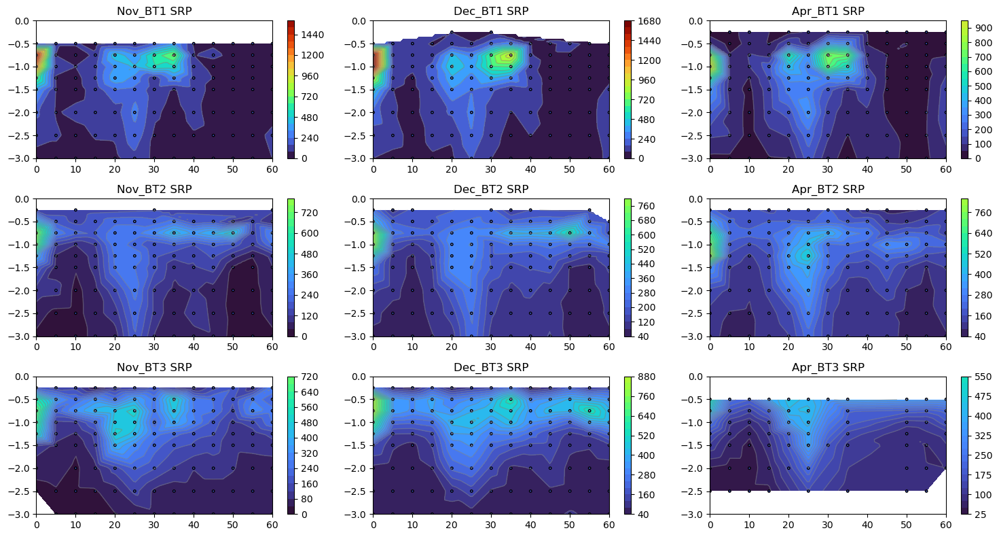

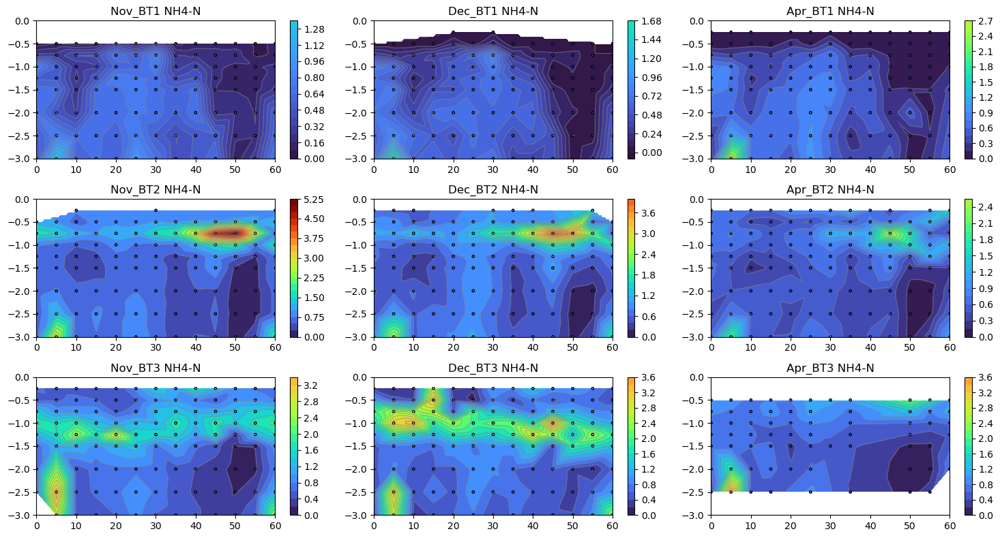

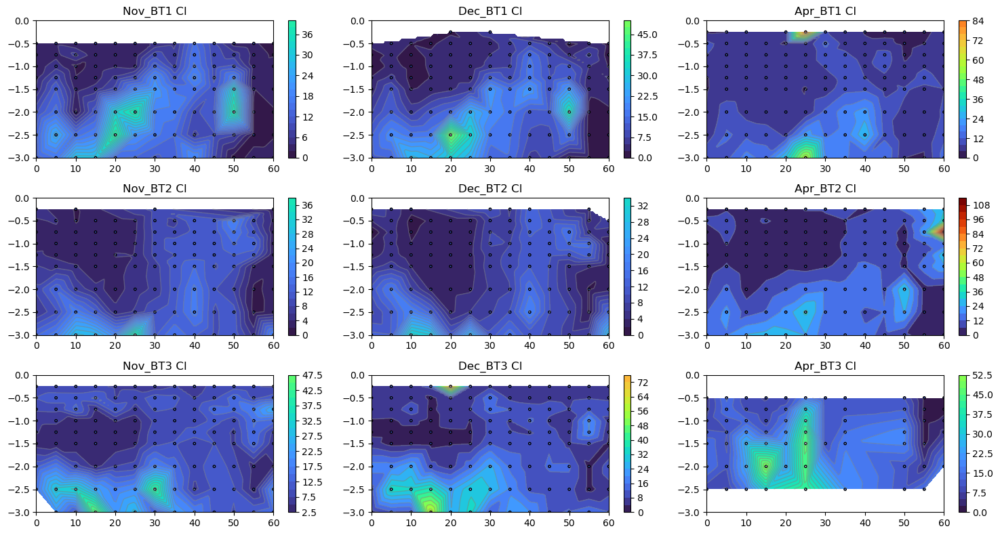

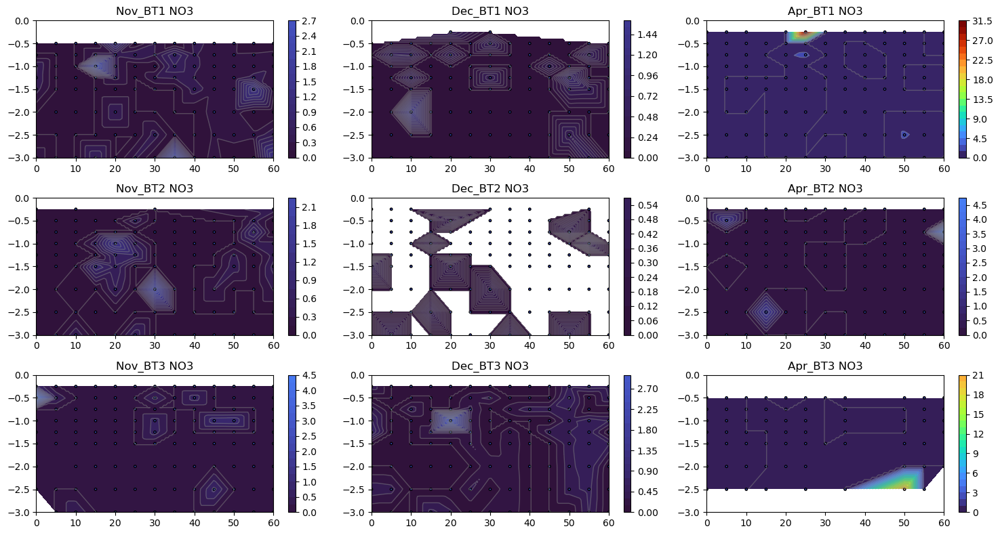

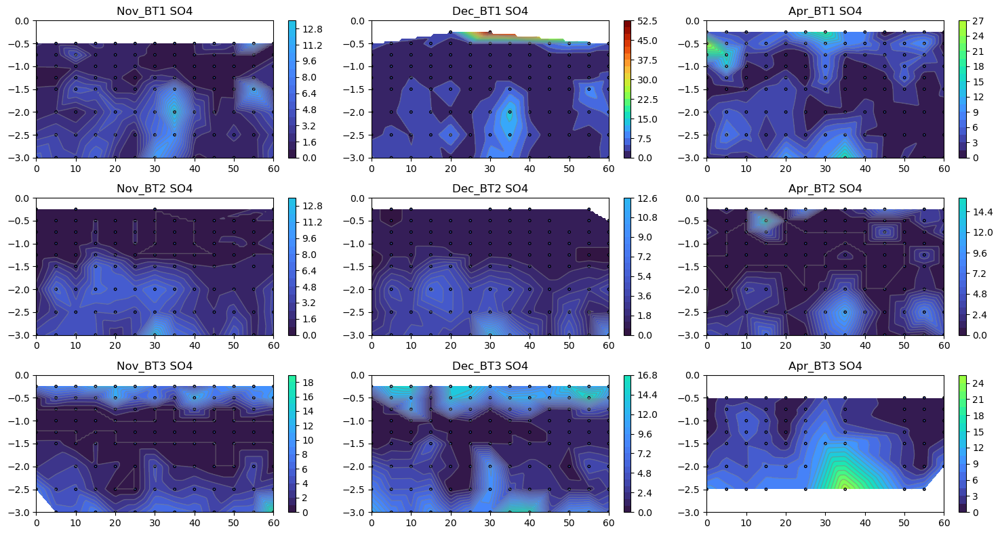

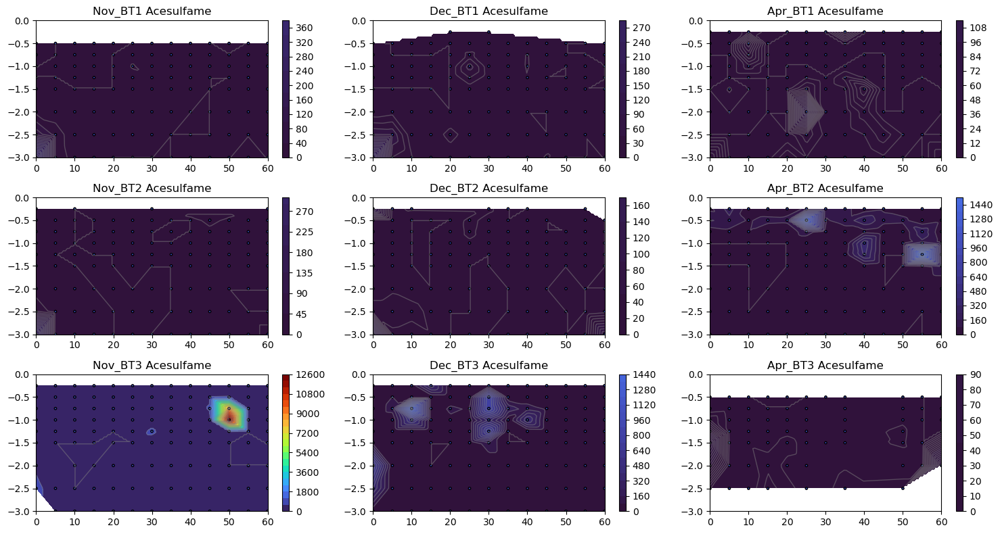

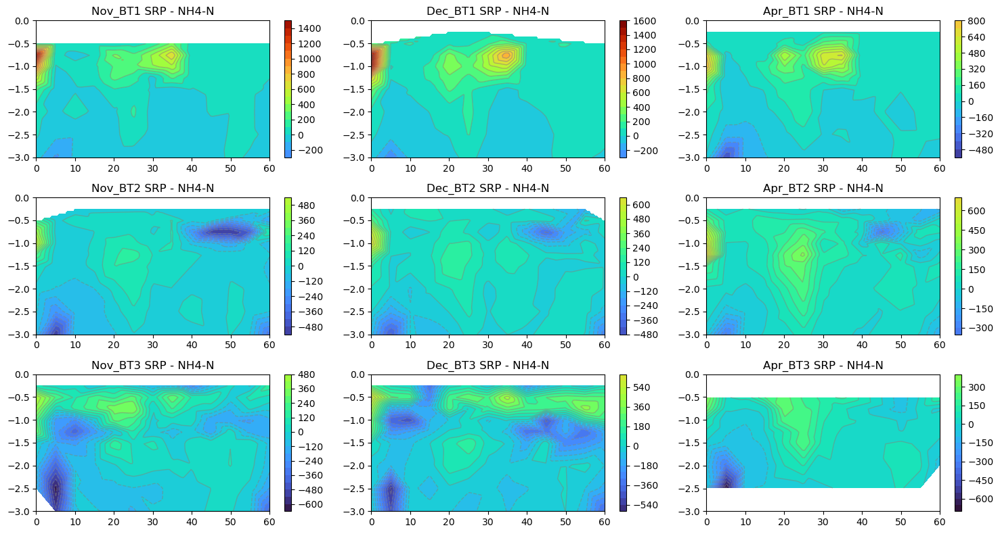

In [180]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.interpolate import griddata

# Assuming raw_data and sheet_names are properly defined
# raw_data = {}
# sheet_names = []
sheet_names = ['Nov_BT1', 'Dec_BT1', 'Apr_BT1', 'Nov_BT2', 'Dec_BT2', 'Apr_BT2', 'Nov_BT3', 'Dec_BT3', 'Apr_BT3']
contour_dict = {}
parameters = ['SRP', 'NH4-N', 'Cl', 'NO3', 'SO4', 'Acesulfame']

# Processing data for each parameter and interpolating
for parm in parameters:
    grid_zs = {}
    contour_dict[parm] = grid_zs
    
    for sheet in sheet_names:
        df1 = raw_data[sheet].copy()
        df1 = df1[~df1[parm].isna()]
        xs, ys, zs = df1['x'], df1['y'], df1[parm]
        
        grid_x, grid_y = np.meshgrid(np.linspace(0, 60, 120), np.linspace(-3, 0, 60))
        grid_z = griddata((xs.values, ys.values), zs.values, (grid_x, grid_y), method='linear')
        grid_zs[sheet] = grid_z

# Ensure the parameters 'SRP' and 'NH4-N' are processed before this step
if 'SRP' in contour_dict and 'NH4-N' in contour_dict:
    grid_zs = {}
    contour_dict['SRP - NH4-N'] = grid_zs
    for key in contour_dict['SRP'].keys():
        if key in contour_dict['NH4-N']:  # Ensuring the key exists in both
            grid_zs[key] = contour_dict['SRP'][key] - contour_dict['NH4-N'][key] * 200

# Now include the derived parameter in the parameters list
parameters.append('SRP - NH4-N')

# Plotting each parameter
for parm in parameters:
    if parm in contour_dict:  # Check if the parameter has been computed
        vmin = np.nanmin([np.nanmin(z) for z in contour_dict[parm].values()])
        vmax = np.nanmax([np.nanmax(z) for z in contour_dict[parm].values()])

        fig, axes = plt.subplots(3, 3, figsize=(15, 8))
        n = 0

        for sheet in sheet_names:
            if sheet in contour_dict[parm]:  # Check if the sheet data is available
                ax = axes.flatten()[n]
                grid_x, grid_y = np.meshgrid(np.linspace(0, 60, 120), np.linspace(-3, 0, 60))
                grid_z = contour_dict[parm][sheet]

                # Plotting the interpolated surface and scatter points
                contour = ax.contourf(grid_x, grid_y, grid_z, cmap='turbo', levels=20, vmin=vmin, vmax=vmax)
                ax.contour(grid_x, grid_y, grid_z, levels=20, colors='grey', linewidths=1, alpha=0.5)

                df1 = raw_data[sheet]
                if parm != 'SRP - NH4-N':
                    ax.scatter(df1['x'], df1['y'], c=df1[parm], cmap='coolwarm', edgecolors='k', s=6, vmin=vmin, vmax=vmax)

                ax.set_ylim(-3.0, 0)
                ax.set_xlim(0, 60)
                ax.set_title(f'{sheet} {parm}')
                fig.colorbar(contour, ax=ax)
                n += 1

        plt.tight_layout()
        plt.show()


In [258]:
import numpy as np

def generate_tidy_ticks(vmin, vmax, num_ticks=10):
    # Calculate the range
    range_val = vmax - vmin
    if range_val == 0:
        return [vmin]

    # Estimate the order of magnitude of the range
    order_of_magnitude = np.floor(np.log10(range_val))
    magnitude = 10 ** order_of_magnitude

    # Choose step sizes based on desired tick count and magnitude
    possible_steps = [0.1,0.5,1, 2, 5, 10]  # steps that typically result in clean numbers
    steps = [p * magnitude for p in possible_steps]

    # Choose the best step that results in an appropriate number of ticks
    best_step = min(steps, key=lambda x: abs(range_val / x - num_ticks))

    # Generate the ticks
    start_tick = np.ceil(vmin / best_step) * best_step
    end_tick = np.floor(vmax / best_step) * best_step
    ticks = np.arange(start_tick, end_tick + best_step, best_step)

    return ticks.tolist()

# Example usage:
vmin, vmax = 0,1610
ticks = generate_tidy_ticks(vmin, vmax)
print(ticks)


[0.0, 100.0, 200.0, 300.0, 400.0, 500.0, 600.0, 700.0, 800.0, 900.0, 1000.0, 1100.0, 1200.0, 1300.0, 1400.0, 1500.0, 1600.0]


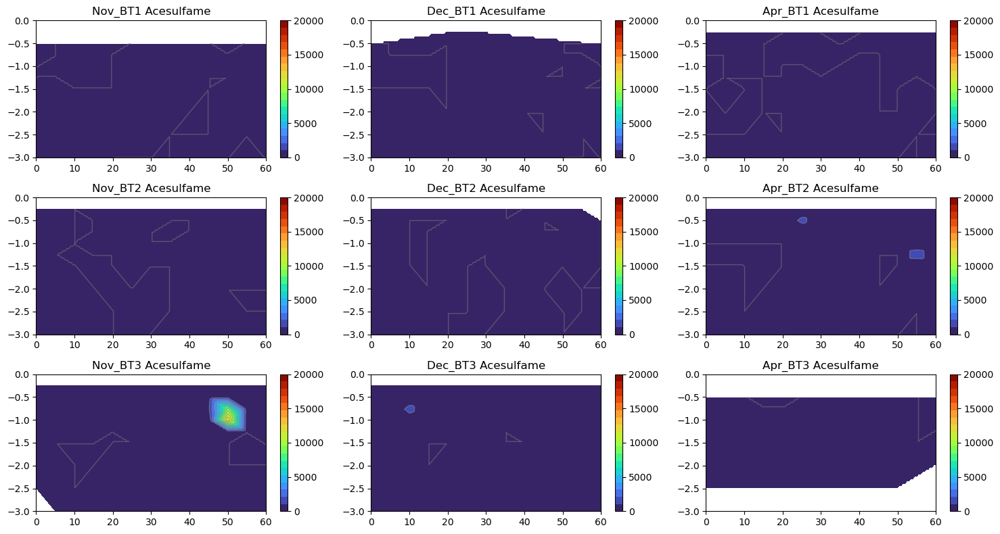

In [259]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.interpolate import griddata

# Define constants for the meshgrid dimensions
GRID_X = np.linspace(0, 60, 120)
GRID_Y = np.linspace(-3, 0, 60)

def interpolate_data(df, parameter):
    """Interpolates non-missing data for a given parameter."""
    valid_data = df[~df[parameter].isna()]
    xs, ys, zs = valid_data['x'], valid_data['y'], valid_data[parameter]
    grid_x, grid_y = np.meshgrid(GRID_X, GRID_Y)
    return griddata((xs.values, ys.values), zs.values, (grid_x, grid_y), method='linear')

def plot_contour(ax, grid_x, grid_y, grid_z, vmin, vmax, title):
    """Plots interpolated data on an axis."""
    contour = ax.contourf(grid_x, grid_y, grid_z, cmap='turbo', levels=np.linspace(vmin,vmax,20), vmin=vmin, vmax=vmax)
    ax.contour(grid_x, grid_y, grid_z, levels=np.linspace(vmin,vmax,20), colors='grey', linewidths=1, alpha=0.5)
    cbar = fig.colorbar(contour, ax=ax)
    cbar.set_ticks(generate_tidy_ticks(vmin, vmax))
    ax.set_ylim(-3.0, 0)
    ax.set_xlim(0, 60)
    ax.set_title(title)
    contour.set_clim(vmin,vmax)


# Assuming raw_data and sheet_names are defined
contour_dict = {}
parameters = [ 'Acesulfame']

for parameter in parameters:
    contour_dict[parameter] = {sheet: interpolate_data(raw_data[sheet], parameter) for sheet in sheet_names}

if 'SRP' in contour_dict and 'NH4-N' in contour_dict:
    contour_dict['SRP - NH4-N'] = {
        key: contour_dict['SRP'][key] - contour_dict['NH4-N'][key] * 200
        for key in contour_dict['SRP'].keys() if key in contour_dict['NH4-N']
    }
parameters.append('SRP - NH4-N')

# Plotting
for parameter in parameters:
    if parameter in contour_dict:
        vmin = np.nanmin([np.nanmin(z) for z in contour_dict[parameter].values()])
        vmax = np.nanmax([np.nanmax(z) for z in contour_dict[parameter].values()])
        vmin = 0
        vmax = 20000
        fig, axes = plt.subplots(3, 3, figsize=(15, 8))
        grid_x, grid_y = np.meshgrid(GRID_X, GRID_Y)  # Create meshgrid only once outside the loop

        for n, (sheet, grid_z) in enumerate(contour_dict[parameter].items()):
            if n >= 9:
                break  # Do not plot more than 9 subplots
            ax = axes.flatten()[n]
            plot_contour(ax, grid_x, grid_y, grid_z, vmin, vmax, f'{sheet} {parameter}')
            
        plt.tight_layout()
        plt.show()


In [197]:
df1.columns

Index(['Sample', 'Date', 'Sample.1', 'x', 'y', 'SRP', 'SRP dilution', 'NH4-N',
       'NH4 dilution', 'F', 'Unnamed: 10', 'Cl', 'Unnamed: 12', 'NO2',
       'Unnamed: 14', 'Br', 'Unnamed: 16', 'SO4', 'Unnamed: 18', 'NO3',
       'Unnamed: 20', 'PO4', 'Unnamed: 22', 'Acesulfame', 'Saccharin',
       'Cyclamate', 'Sucralose', 'Perchlorate', 'Glyphosate', '2,4-D ',
       'Fosamine', 'MCPA', 'Picloram', 'Delta 2H (‰)', 'Delta 18O (‰)'],
      dtype='object')

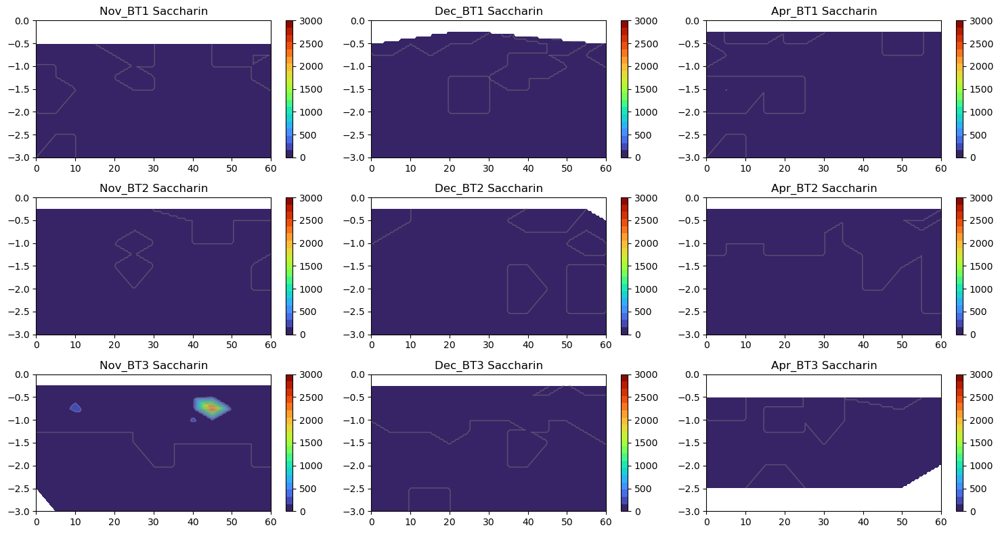

In [261]:
contour_dict = {}
parameters = [ 'Saccharin']

for parameter in parameters:
    contour_dict[parameter] = {sheet: interpolate_data(raw_data[sheet], parameter) for sheet in sheet_names}

if 'SRP' in contour_dict and 'NH4-N' in contour_dict:
    contour_dict['SRP - NH4-N'] = {
        key: contour_dict['SRP'][key] - contour_dict['NH4-N'][key] * 200
        for key in contour_dict['SRP'].keys() if key in contour_dict['NH4-N']
    }
parameters.append('SRP - NH4-N')

# Plotting
for parameter in parameters:
    if parameter in contour_dict:
        vmin = np.nanmin([np.nanmin(z) for z in contour_dict[parameter].values()])
        vmax = np.nanmax([np.nanmax(z) for z in contour_dict[parameter].values()])
        vmin = 0
        vmax = 3000
        fig, axes = plt.subplots(3, 3, figsize=(15, 8))
        grid_x, grid_y = np.meshgrid(GRID_X, GRID_Y)  # Create meshgrid only once outside the loop

        for n, (sheet, grid_z) in enumerate(contour_dict[parameter].items()):
            if n >= 9:
                break  # Do not plot more than 9 subplots
            ax = axes.flatten()[n]
            plot_contour(ax, grid_x, grid_y, grid_z, vmin, vmax, f'{sheet} {parameter}')
            
        plt.tight_layout()
        plt.show()

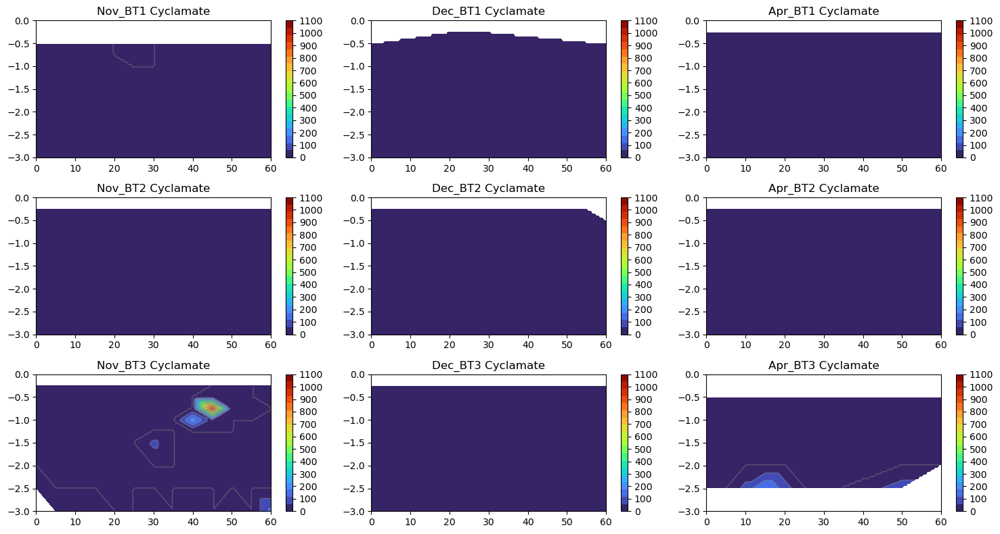

In [264]:
contour_dict = {}
parameters = [ 'Cyclamate']

for parameter in parameters:
    contour_dict[parameter] = {sheet: interpolate_data(raw_data[sheet], parameter) for sheet in sheet_names}


# Plotting
for parameter in parameters:
    if parameter in contour_dict:
        vmin = np.nanmin([np.nanmin(z) for z in contour_dict[parameter].values()])
        vmax = np.nanmax([np.nanmax(z) for z in contour_dict[parameter].values()])
        vmin = 0
        vmax = 1100
        fig, axes = plt.subplots(3, 3, figsize=(15, 8))
        grid_x, grid_y = np.meshgrid(GRID_X, GRID_Y)  # Create meshgrid only once outside the loop

        for n, (sheet, grid_z) in enumerate(contour_dict[parameter].items()):
            if n >= 9:
                break  # Do not plot more than 9 subplots
            ax = axes.flatten()[n]
            plot_contour(ax, grid_x, grid_y, grid_z, vmin, vmax, f'{sheet} {parameter}')
            
        plt.tight_layout()
        plt.show()

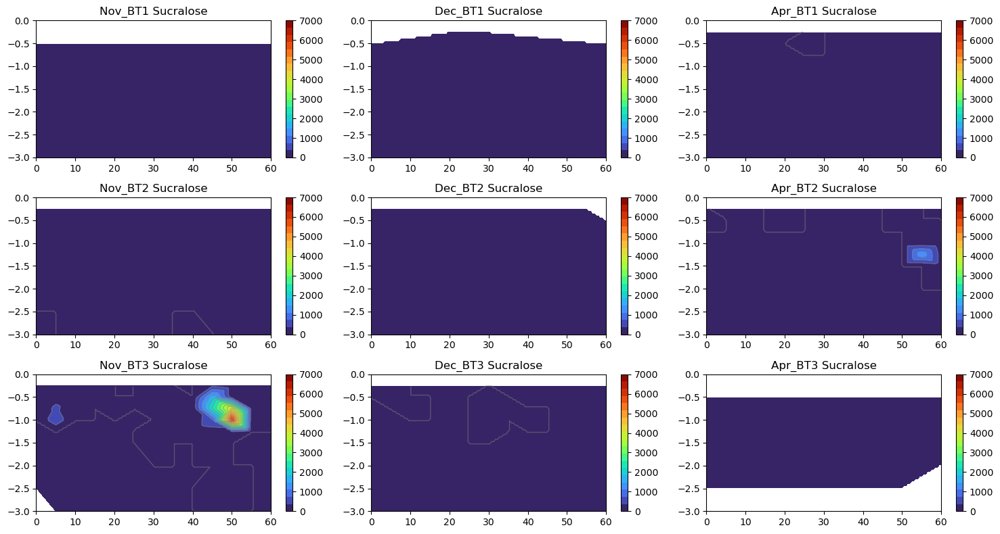

In [263]:
contour_dict = {}
parameters = [ 'Sucralose']

for parameter in parameters:
    contour_dict[parameter] = {sheet: interpolate_data(raw_data[sheet], parameter) for sheet in sheet_names}


# Plotting
for parameter in parameters:
    if parameter in contour_dict:
        vmin = np.nanmin([np.nanmin(z) for z in contour_dict[parameter].values()])
        vmax = np.nanmax([np.nanmax(z) for z in contour_dict[parameter].values()])
        vmin = 0
        vmax = 7000
        fig, axes = plt.subplots(3, 3, figsize=(15, 8))
        grid_x, grid_y = np.meshgrid(GRID_X, GRID_Y)  # Create meshgrid only once outside the loop

        for n, (sheet, grid_z) in enumerate(contour_dict[parameter].items()):
            if n >= 9:
                break  # Do not plot more than 9 subplots
            ax = axes.flatten()[n]
            plot_contour(ax, grid_x, grid_y, grid_z, vmin, vmax, f'{sheet} {parameter}')
            
        plt.tight_layout()
        plt.show()

In [218]:
df1.columns

Index(['Sample', 'Date', 'Sample.1', 'x', 'y', 'SRP', 'SRP dilution', 'NH4-N',
       'NH4 dilution', 'F', 'Unnamed: 10', 'Cl', 'Unnamed: 12', 'NO2',
       'Unnamed: 14', 'Br', 'Unnamed: 16', 'SO4', 'Unnamed: 18', 'NO3',
       'Unnamed: 20', 'PO4', 'Unnamed: 22', 'Acesulfame', 'Saccharin',
       'Cyclamate', 'Sucralose', 'Perchlorate', 'Glyphosate', '2,4-D ',
       'Fosamine', 'MCPA', 'Picloram', 'Delta 2H (‰)', 'Delta 18O (‰)'],
      dtype='object')

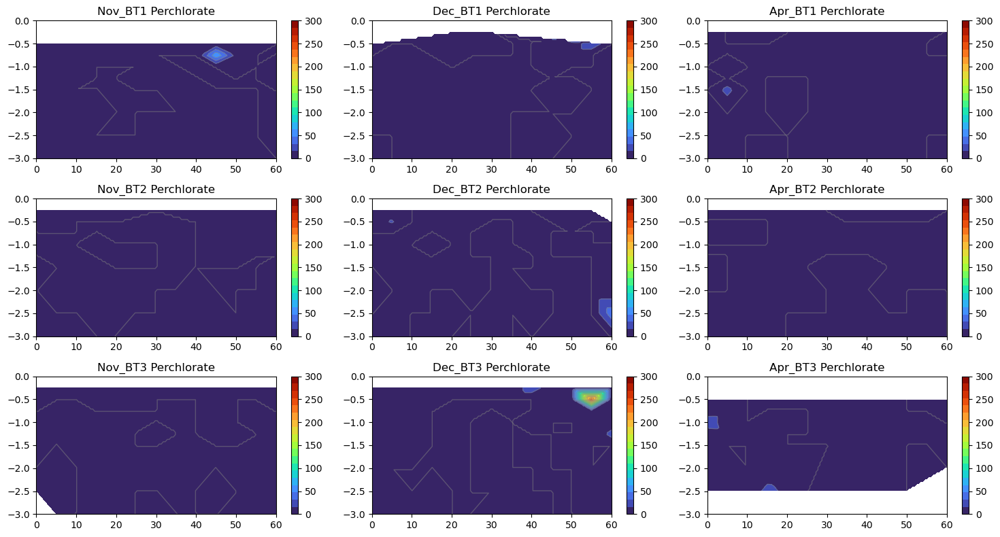

In [265]:
contour_dict = {}
parameters = [ 'Perchlorate']

for parameter in parameters:
    contour_dict[parameter] = {sheet: interpolate_data(raw_data[sheet], parameter) for sheet in sheet_names}


# Plotting
for parameter in parameters:
    if parameter in contour_dict:
        vmin = np.nanmin([np.nanmin(z) for z in contour_dict[parameter].values()])
        vmax = np.nanmax([np.nanmax(z) for z in contour_dict[parameter].values()])
        vmin = 0
        vmax = 300
        fig, axes = plt.subplots(3, 3, figsize=(15, 8))
        grid_x, grid_y = np.meshgrid(GRID_X, GRID_Y)  # Create meshgrid only once outside the loop

        for n, (sheet, grid_z) in enumerate(contour_dict[parameter].items()):
            if n >= 9:
                break  # Do not plot more than 9 subplots
            ax = axes.flatten()[n]
            plot_contour(ax, grid_x, grid_y, grid_z, vmin, vmax, f'{sheet} {parameter}')
            
        plt.tight_layout()
        plt.show()

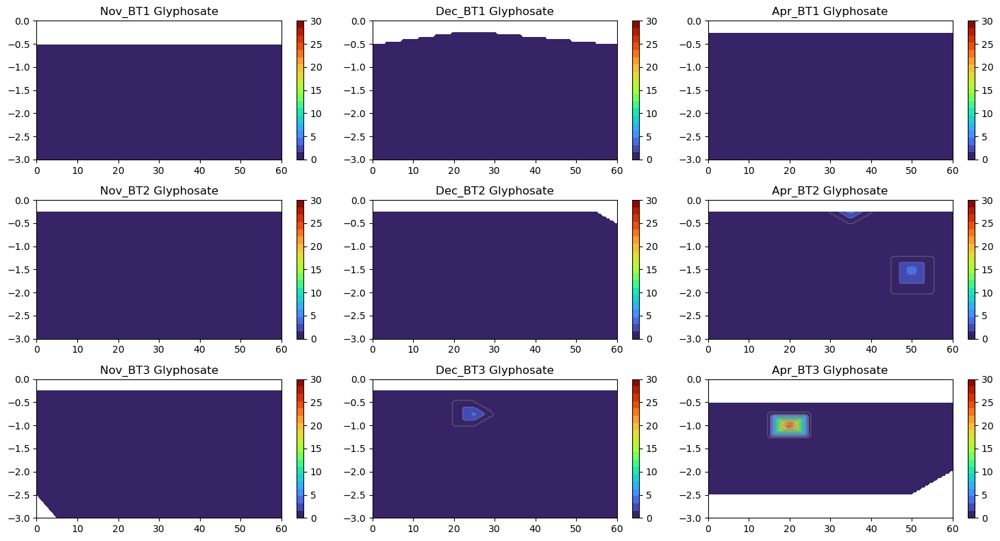

In [266]:
contour_dict = {}
parameters = [ 'Glyphosate']

for parameter in parameters:
    contour_dict[parameter] = {sheet: interpolate_data(raw_data[sheet], parameter) for sheet in sheet_names}


# Plotting
for parameter in parameters:
    if parameter in contour_dict:
        vmin = np.nanmin([np.nanmin(z) for z in contour_dict[parameter].values()])
        vmax = np.nanmax([np.nanmax(z) for z in contour_dict[parameter].values()])
        vmin = 0
        vmax = 30
        fig, axes = plt.subplots(3, 3, figsize=(15, 8))
        grid_x, grid_y = np.meshgrid(GRID_X, GRID_Y)  # Create meshgrid only once outside the loop

        for n, (sheet, grid_z) in enumerate(contour_dict[parameter].items()):
            if n >= 9:
                break  # Do not plot more than 9 subplots
            ax = axes.flatten()[n]
            plot_contour(ax, grid_x, grid_y, grid_z, vmin, vmax, f'{sheet} {parameter}')
            
        plt.tight_layout()
        plt.show()

In [232]:
print(df1.columns)

Index(['Sample', 'Date', 'Sample.1', 'x', 'y', 'SRP', 'SRP dilution', 'NH4-N',
       'NH4 dilution', 'F', 'Unnamed: 10', 'Cl', 'Unnamed: 12', 'NO2',
       'Unnamed: 14', 'Br', 'Unnamed: 16', 'SO4', 'Unnamed: 18', 'NO3',
       'Unnamed: 20', 'PO4', 'Unnamed: 22', 'Acesulfame', 'Saccharin',
       'Cyclamate', 'Sucralose', 'Perchlorate', 'Glyphosate', '2,4-D ',
       'Fosamine', 'MCPA', 'Picloram', 'Delta 2H (‰)', 'Delta 18O (‰)'],
      dtype='object')


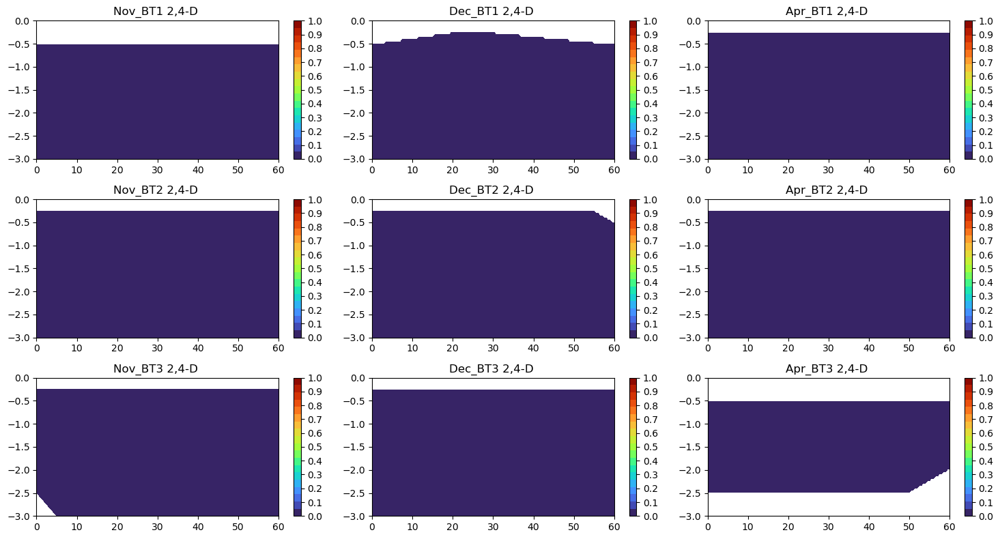

In [268]:
contour_dict = {}
parameters = [ '2,4-D ']

for parameter in parameters:
    contour_dict[parameter] = {sheet: interpolate_data(raw_data[sheet], parameter) for sheet in sheet_names}


# Plotting
for parameter in parameters:
    if parameter in contour_dict:
        vmin = np.nanmin([np.nanmin(z) for z in contour_dict[parameter].values()])
        vmax = np.nanmax([np.nanmax(z) for z in contour_dict[parameter].values()])
        vmin = 0
        vmax = 1
        fig, axes = plt.subplots(3, 3, figsize=(15, 8))
        grid_x, grid_y = np.meshgrid(GRID_X, GRID_Y)  # Create meshgrid only once outside the loop

        for n, (sheet, grid_z) in enumerate(contour_dict[parameter].items()):
            if n >= 9:
                break  # Do not plot more than 9 subplots
            ax = axes.flatten()[n]
            plot_contour(ax, grid_x, grid_y, grid_z, vmin, vmax, f'{sheet} {parameter}')
            
        plt.tight_layout()
        plt.show()

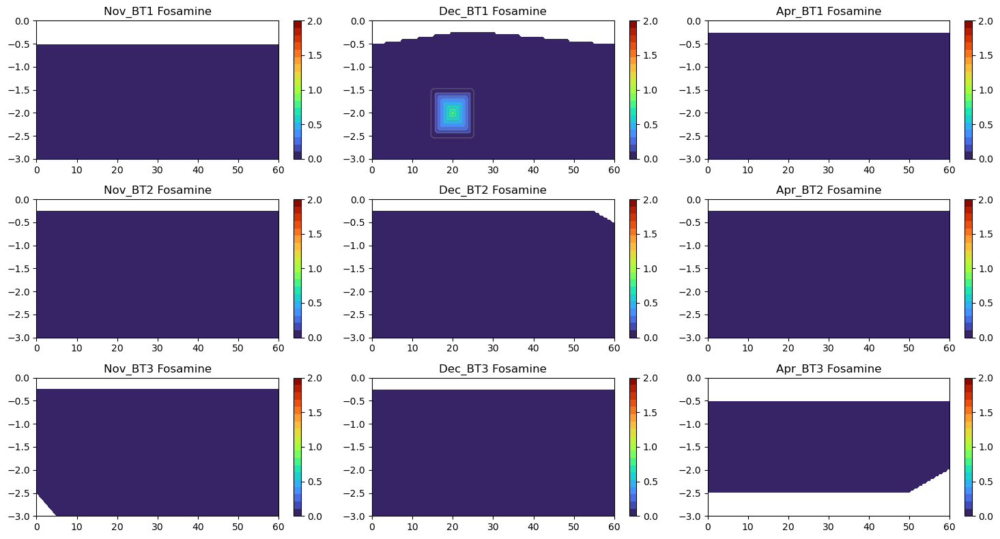

In [269]:
contour_dict = {}
parameters = [ 'Fosamine']

for parameter in parameters:
    contour_dict[parameter] = {sheet: interpolate_data(raw_data[sheet], parameter) for sheet in sheet_names}


# Plotting
for parameter in parameters:
    if parameter in contour_dict:
        vmin = np.nanmin([np.nanmin(z) for z in contour_dict[parameter].values()])
        vmax = np.nanmax([np.nanmax(z) for z in contour_dict[parameter].values()])
        vmin = 0
        vmax = 2
        fig, axes = plt.subplots(3, 3, figsize=(15, 8))
        grid_x, grid_y = np.meshgrid(GRID_X, GRID_Y)  # Create meshgrid only once outside the loop

        for n, (sheet, grid_z) in enumerate(contour_dict[parameter].items()):
            if n >= 9:
                break  # Do not plot more than 9 subplots
            ax = axes.flatten()[n]
            plot_contour(ax, grid_x, grid_y, grid_z, vmin, vmax, f'{sheet} {parameter}')
            
        plt.tight_layout()
        plt.show()

In [273]:
df1.columns

Index(['Sample', 'Date', 'Sample.1', 'x', 'y', 'SRP', 'SRP dilution', 'NH4-N',
       'NH4 dilution', 'F', 'Unnamed: 10', 'Cl', 'Unnamed: 12', 'NO2',
       'Unnamed: 14', 'Br', 'Unnamed: 16', 'SO4', 'Unnamed: 18', 'NO3',
       'Unnamed: 20', 'PO4', 'Unnamed: 22', 'Acesulfame', 'Saccharin',
       'Cyclamate', 'Sucralose', 'Perchlorate', 'Glyphosate', '2,4-D ',
       'Fosamine', 'MCPA', 'Picloram', 'Delta 2H (‰)', 'Delta 18O (‰)'],
      dtype='object')

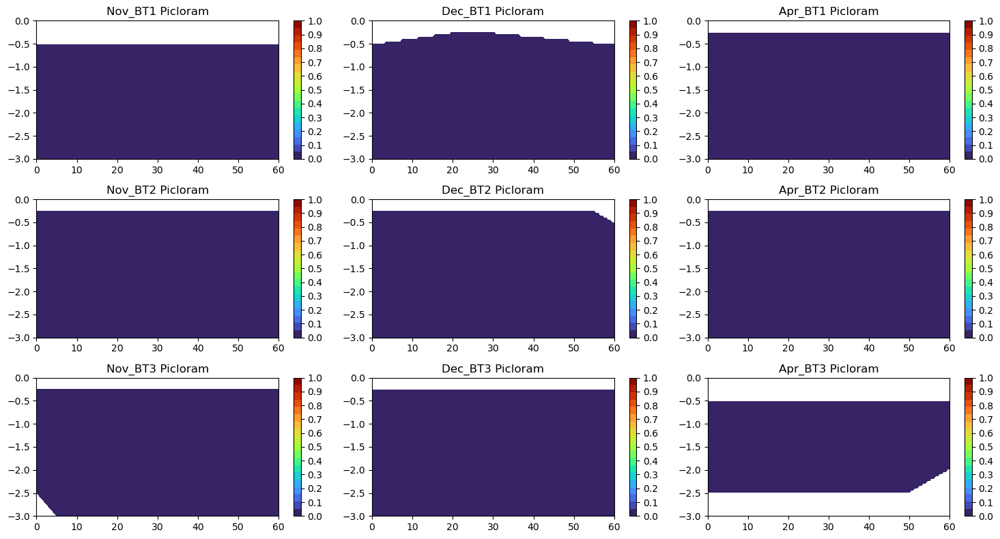

In [274]:
contour_dict = {}
parameters = [ 'Picloram']

for parameter in parameters:
    contour_dict[parameter] = {sheet: interpolate_data(raw_data[sheet], parameter) for sheet in sheet_names}


# Plotting
for parameter in parameters:
    if parameter in contour_dict:
        vmin = np.nanmin([np.nanmin(z) for z in contour_dict[parameter].values()])
        vmax = np.nanmax([np.nanmax(z) for z in contour_dict[parameter].values()])
        vmin = 0
        vmax = 1
        fig, axes = plt.subplots(3, 3, figsize=(15, 8))
        grid_x, grid_y = np.meshgrid(GRID_X, GRID_Y)  # Create meshgrid only once outside the loop

        for n, (sheet, grid_z) in enumerate(contour_dict[parameter].items()):
            if n >= 9:
                break  # Do not plot more than 9 subplots
            ax = axes.flatten()[n]
            plot_contour(ax, grid_x, grid_y, grid_z, vmin, vmax, f'{sheet} {parameter}')
            
        plt.tight_layout()
        plt.show()

## Isotops

In [275]:
df1.columns

Index(['Sample', 'Date', 'Sample.1', 'x', 'y', 'SRP', 'SRP dilution', 'NH4-N',
       'NH4 dilution', 'F', 'Unnamed: 10', 'Cl', 'Unnamed: 12', 'NO2',
       'Unnamed: 14', 'Br', 'Unnamed: 16', 'SO4', 'Unnamed: 18', 'NO3',
       'Unnamed: 20', 'PO4', 'Unnamed: 22', 'Acesulfame', 'Saccharin',
       'Cyclamate', 'Sucralose', 'Perchlorate', 'Glyphosate', '2,4-D ',
       'Fosamine', 'MCPA', 'Picloram', 'Delta 2H (‰)', 'Delta 18O (‰)'],
      dtype='object')

In [276]:
contour_dict = {}
parameters = [ 'Delta 2H (‰)']

for parameter in parameters:
    contour_dict[parameter] = {sheet: interpolate_data(raw_data[sheet], parameter) for sheet in sheet_names}


# Plotting
for parameter in parameters:
    if parameter in contour_dict:
        vmin = np.nanmin([np.nanmin(z) for z in contour_dict[parameter].values()])
        vmax = np.nanmax([np.nanmax(z) for z in contour_dict[parameter].values()])
        vmin = 0
        vmax = 1
        fig, axes = plt.subplots(3, 3, figsize=(15, 8))
        grid_x, grid_y = np.meshgrid(GRID_X, GRID_Y)  # Create meshgrid only once outside the loop

        for n, (sheet, grid_z) in enumerate(contour_dict[parameter].items()):
            if n >= 9:
                break  # Do not plot more than 9 subplots
            ax = axes.flatten()[n]
            plot_contour(ax, grid_x, grid_y, grid_z, vmin, vmax, f'{sheet} {parameter}')
            
        plt.tight_layout()
        plt.show()

KeyError: 'Delta 2H (‰)'

# Figure 3

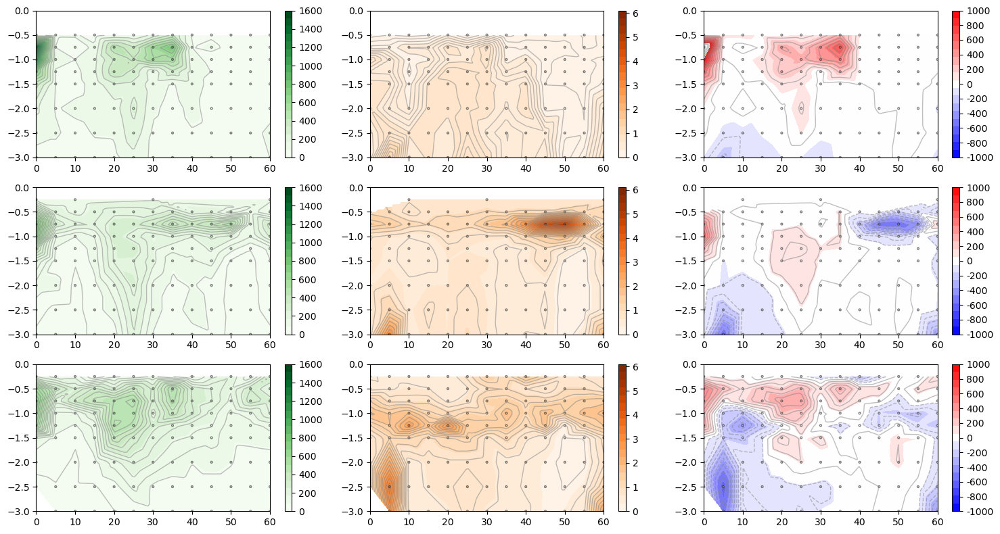

In [177]:
import matplotlib.pyplot as plt
import numpy as np

# Define the specific sheets, parameters, their ranges, and colormaps
sheet_names = ['Nov_BT1', 'Nov_BT2', 'Nov_BT3']
parameters = {
    'SRP': (0, 1600, 'Greens'),  # Using viridis for SRP
    'NH4-N': (0, 6, 'Oranges'),  # Using plasma for NH4-N
    'SRP - NH4-N': (-1000, 1000, 'bwr')    # Using cividis for NO3
}

# Creating a figure and axes
fig, axes = plt.subplots(3, 3, figsize=(15, 8))

# Loop through each parameter and its respective column in the subplot grid
for col, (parm, (vmin, vmax, cmap)) in enumerate(parameters.items()):
    if parm in contour_dict:  # Check if the parameter has been computed
        for row, sheet in enumerate(sheet_names):
            if sheet in contour_dict[parm]:  # Check if the sheet data is available
                ax = axes[row, col]
                grid_x, grid_y = np.meshgrid(np.linspace(0, 60, 120), np.linspace(-3, 0, 60))
                grid_z = contour_dict[parm][sheet]

                # Plotting the interpolated surface and scatter points with specific colormap
                contour = ax.contourf(grid_x, grid_y, grid_z, cmap=cmap, levels=np.linspace(vmin,vmax+0.1,20), vmin=vmin, vmax=vmax)
                ax.contour(grid_x, grid_y, grid_z, levels=20, colors='grey', linewidths=1, alpha=0.5)
                contour.set_clim(vmin,vmax)

                df1 = raw_data[sheet]
                if parm!='SRP - NH4-N':
                    ax.scatter(df1['x'], df1['y'], c=df1[parm], cmap=cmap, edgecolors='k', s=4, vmin=vmin, vmax=vmax,alpha=0.5)
                
                else:
                    ax.scatter(df1['x'], df1['y'], c=df1['NH4-N'], cmap=cmap, edgecolors='k', s=4, vmin=vmin, vmax=vmax,alpha=0.5)

                ax.set_ylim(-3.0, 0)
                ax.set_xlim(0, 60)
                # d = sheet.split('_')[0]
                # bt = sheet.split('_')[1]
                # ax.set_title(f'{d} {bt}  {parm}')
                cbar = fig.colorbar(contour, ax=ax)
                if parm == 'SRP':
                    cbar.set_ticks(np.arange(vmin, vmax+200, 200))
                    cbar.set_ticklabels([round(i,2) for i in np.arange(vmin, vmax+200 , 200)])

                if parm == 'NH4-N':
                    cbar.set_ticks(np.arange(vmin, vmax+1, 1))
                    cbar.set_ticklabels([round(i,2) for i in np.arange(vmin, vmax+1 , 1)])

                if parm == 'SRP - NH4-N':
                    cbar.set_ticks(np.arange(vmin, vmax+200, 200))
                    cbar.set_ticklabels([round(i,2) for i in np.arange(vmin, vmax+200 , 200)])



# Adjust layout
plt.tight_layout()
plt.show()


In [131]:
print(sheet_names)

['Nov_BT1', 'Dec_BT1', 'Apr_BT1', 'Nov_BT2', 'Dec_BT2', 'Apr_BT2', 'Nov_BT3', 'Dec_BT3', 'Apr_BT3']


/var/folders/hy/v14_l_r91tl2w5s9xfm9p2kc0000gn/T/ipykernel_28582/2465626724.py:44: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


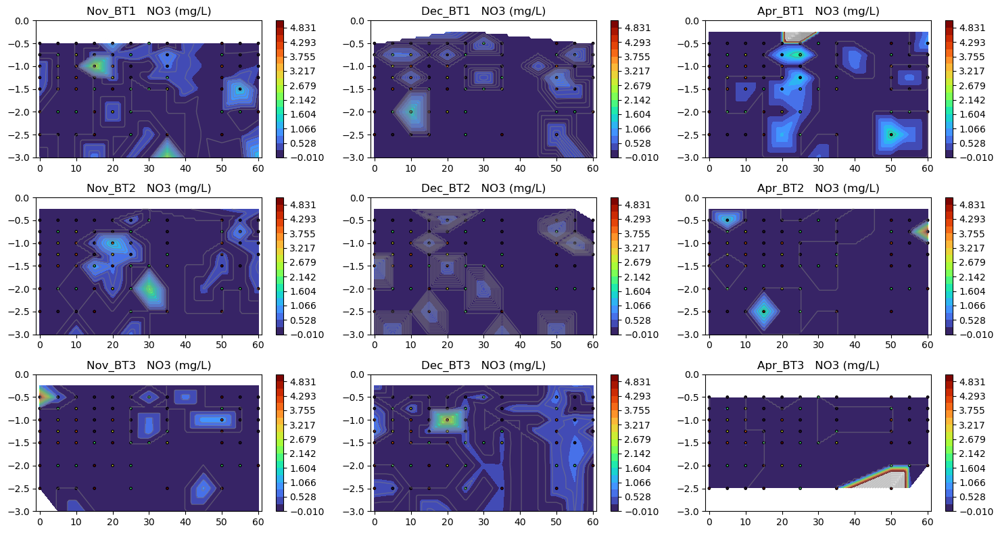

In [141]:

sheet_names = ['Nov_BT1', 'Dec_BT1', 'Apr_BT1', 'Nov_BT2', 'Dec_BT2', 'Apr_BT2', 'Nov_BT3', 'Dec_BT3', 'Apr_BT3']
for parm in ['NO3']:
    #vmin = np.nanmin([np.nanmin(raw_data[key][parm]) for key in raw_data.keys()])
    vmin = -0.01
    vmax =np.max([np.nanmax(i) for i in contour_dict[parm].values()])
    vmax = 5


    fig,axes = plt.subplots(3,3)
    n = 0
    for sheet in sheet_names:

        grid_x, grid_y = np.meshgrid(np.linspace(0, 60, 120), np.linspace(-3,0, 60))

        # Perform the kriging interpolation
        grid_z = contour_dict[parm][sheet]


        # Plot the interpolated surface
        ax = axes.flatten()[n]
        n+=1
        #print(vmin,vmax)
        contour = ax.contourf(grid_x, grid_y, grid_z, cmap='turbo',levels=np.linspace(vmin,vmax+0.1,20),vmin=vmin,vmax=vmax)
        contour.set_clim(vmin,vmax)
        

        ax.contour(grid_x, grid_y, grid_z, levels=20, colors='grey', linewidths=1,alpha=0.5)
        ax.scatter(xs, ys, c=zs, cmap='turbo', edgecolors='k',s=6,vmin=vmin,vmax=vmax)
        
        #plt.colorbar()
        
        ax.set_ylim(-3.0,0)
        ax.set_xlim(-1,61)
        
        cbar = plt.colorbar(contour, ax=ax)
        cbar.set_ticks(np.arange(vmin, vmax + 0.1, 1))
        cbar.set_ticklabels([round(i,2) for i in np.arange(vmin+0.01, vmax + 0.1, 1)])

        ax.set_title('{}   {} (mg/L)'.format(sheet,parm))

    
    fig.set_size_inches(15,8)
    fig.tight_layout()
    fig.show()

/var/folders/hy/v14_l_r91tl2w5s9xfm9p2kc0000gn/T/ipykernel_28582/2407223451.py:42: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


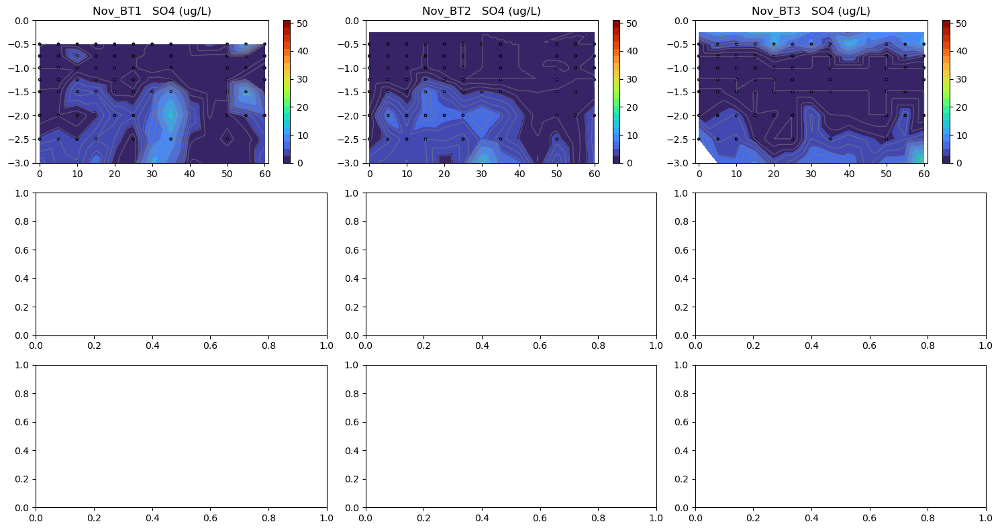

In [108]:
for parm in ['SO4']:
    #vmin = np.nanmin([np.nanmin(raw_data[key][parm]) for key in raw_data.keys()])
    vmin = 0
    vmax =np.max([np.nanmax(i) for i in contour_dict[parm].values()])


    fig,axes = plt.subplots(3,3)
    n = 0
    for sheet in sheet_names:

        grid_x, grid_y = np.meshgrid(np.linspace(0, 60, 120), np.linspace(-3,0, 60))

        # Perform the kriging interpolation
        grid_z = contour_dict[parm][sheet]


        # Plot the interpolated surface
        ax = axes.flatten()[n]
        n+=1
        #print(vmin,vmax)
        contour = ax.contourf(grid_x, grid_y, grid_z, cmap='turbo',levels=np.linspace(vmin,vmax,20+1),vmin=vmin,vmax=vmax)
        contour.set_clim(vmin,vmax)
        

        ax.contour(grid_x, grid_y, grid_z, levels=20, colors='grey', linewidths=1,alpha=0.5)
        ax.scatter(xs, ys, c=zs, cmap='coolwarm', edgecolors='k',s=6,vmin=vmin,vmax=vmax)
        
        #plt.colorbar()
        
        ax.set_ylim(-3.0,0)
        ax.set_xlim(-1,61)
        
        cbar = plt.colorbar(contour, ax=ax)
        cbar.set_ticks(np.arange(vmin, vmax + 1, 10))
        cbar.set_ticklabels([int(i) for i in np.arange(vmin, vmax + 1, 10)])

        ax.set_title('{}   {} (ug/L)'.format(sheet,parm))

    
    fig.set_size_inches(15,8)
    fig.tight_layout()
    fig.show()

/var/folders/hy/v14_l_r91tl2w5s9xfm9p2kc0000gn/T/ipykernel_28582/3859118943.py:42: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


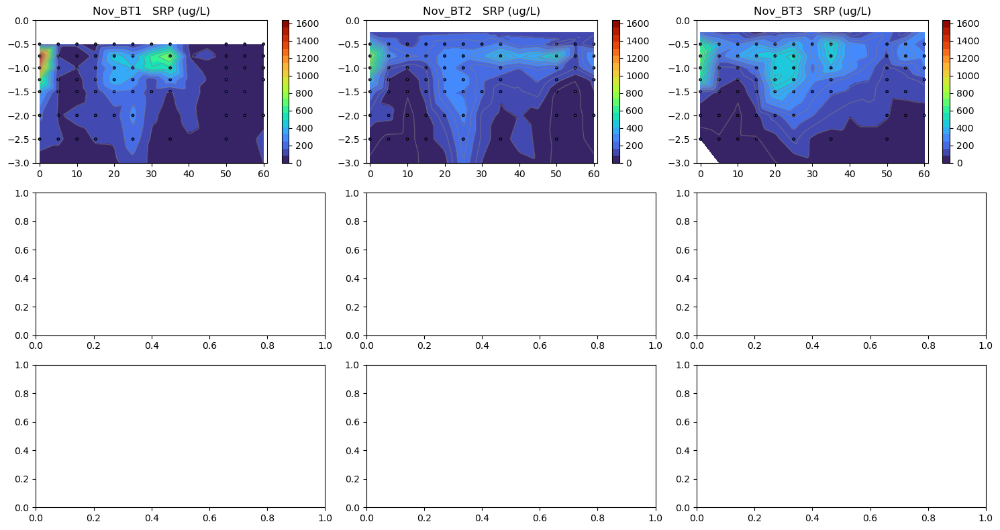

In [107]:
for parm in ['SRP']:
    #vmin = np.nanmin([np.nanmin(raw_data[key][parm]) for key in raw_data.keys()])
    vmin = 0
    vmax =np.max([np.nanmax(i) for i in contour_dict[parm].values()])


    fig,axes = plt.subplots(3,3)
    n = 0
    for sheet in sheet_names:

        grid_x, grid_y = np.meshgrid(np.linspace(0, 60, 120), np.linspace(-3,0, 60))

        # Perform the kriging interpolation
        grid_z = contour_dict[parm][sheet]


        # Plot the interpolated surface
        ax = axes.flatten()[n]
        n+=1
        #print(vmin,vmax)
        contour = ax.contourf(grid_x, grid_y, grid_z, cmap='turbo',levels=np.linspace(vmin,vmax,20+1),vmin=vmin,vmax=vmax)
        contour.set_clim(vmin,vmax)
        

        ax.contour(grid_x, grid_y, grid_z, levels=20, colors='grey', linewidths=1,alpha=0.5)
        ax.scatter(xs, ys, c=zs, cmap='coolwarm', edgecolors='k',s=6,vmin=vmin,vmax=vmax)
        
        #plt.colorbar()
        
        ax.set_ylim(-3.0,0)
        ax.set_xlim(-1,61)
        
        cbar = plt.colorbar(contour, ax=ax)
        cbar.set_ticks(np.arange(vmin, vmax + 1, 200))
        cbar.set_ticklabels([int(i) for i in np.arange(vmin, vmax + 1, 200)])

        ax.set_title('{}   {} (ug/L)'.format(sheet,parm))

    
    fig.set_size_inches(15,8)
    fig.tight_layout()
    fig.show()

C:\Users\swan47\AppData\Local\Temp\ipykernel_32976\1157771648.py:42: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


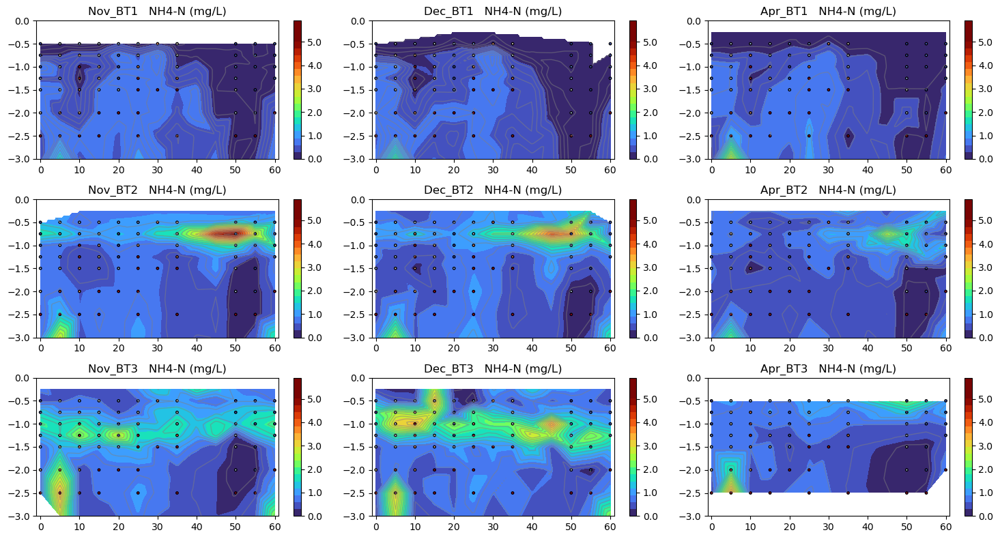

In [140]:
for parm in ['NH4-N']:
    #vmin = np.nanmin([np.nanmin(raw_data[key][parm]) for key in raw_data.keys()])
    vmin = 0
    vmax =np.max([np.nanmax(i) for i in contour_dict[parm].values()])


    fig,axes = plt.subplots(3,3)
    n = 0
    for sheet in sheet_names:

        grid_x, grid_y = np.meshgrid(np.linspace(0, 60, 120), np.linspace(-3,0, 60))

        # Perform the kriging interpolation
        grid_z = contour_dict[parm][sheet]


        # Plot the interpolated surface
        ax = axes.flatten()[n]
        n+=1
        #print(vmin,vmax)
        contour = ax.contourf(grid_x, grid_y, grid_z, cmap='turbo',levels=np.linspace(vmin,vmax+0.9,20+1),vmin=vmin,vmax=vmax)
        contour.set_clim(vmin,vmax)
        

        ax.contour(grid_x, grid_y, grid_z, levels=20, colors='grey', linewidths=1,alpha=0.5)
        ax.scatter(xs, ys, c=zs, cmap='coolwarm', edgecolors='k',s=6,vmin=vmin,vmax=vmax+0.9)
        
        #plt.colorbar()
        
        ax.set_ylim(-3.0,0)
        ax.set_xlim(-1,61)
        
        cbar = plt.colorbar(contour, ax=ax)
        cbar.set_ticks(np.arange(vmin, vmax + 0.9, 1))
        cbar.set_ticklabels([i for i in np.arange(vmin, vmax + 0.9, 1)])

        ax.set_title('{}   {} (mg/L)'.format(sheet,parm))

    
    fig.set_size_inches(15,8)
    fig.tight_layout()
    fig.show()

C:\Users\swan47\AppData\Local\Temp\ipykernel_32976\1118164873.py:42: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


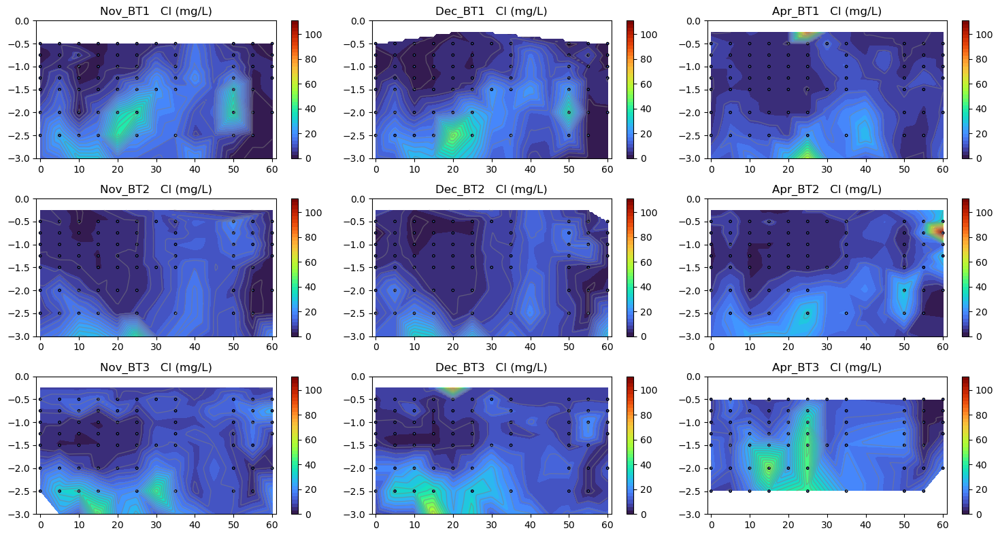

In [139]:
for parm in ['Cl']:
    #vmin = np.nanmin([np.nanmin(raw_data[key][parm]) for key in raw_data.keys()])
    vmin = 0
    vmax =np.max([np.nanmax(i) for i in contour_dict[parm].values()])


    fig,axes = plt.subplots(3,3)
    n = 0
    for sheet in sheet_names:

        grid_x, grid_y = np.meshgrid(np.linspace(0, 60, 120), np.linspace(-3,0, 60))

        # Perform the kriging interpolation
        grid_z = contour_dict[parm][sheet]


        # Plot the interpolated surface
        ax = axes.flatten()[n]
        n+=1
        #print(vmin,vmax)
        contour = ax.contourf(grid_x, grid_y, grid_z, cmap='turbo',levels=np.linspace(vmin,vmax+0.9,20+20),vmin=vmin,vmax=vmax)
        contour.set_clim(vmin,vmax)
        

        ax.contour(grid_x, grid_y, grid_z, levels=20, colors='grey', linewidths=1,alpha=0.5)
        ax.scatter(xs, ys, c=zs, cmap='coolwarm', edgecolors='k',s=6,vmin=vmin,vmax=vmax+0.9)
        
        #plt.colorbar()
        
        ax.set_ylim(-3.0,0)
        ax.set_xlim(-1,61)
        
        cbar = plt.colorbar(contour, ax=ax)
        cbar.set_ticks(np.arange(vmin, vmax + 0.9, 20))
        cbar.set_ticklabels([int(i) for i in np.arange(vmin, vmax + 0.9, 20)])

        ax.set_title('{}   {} (mg/L)'.format(sheet,parm))

    
    fig.set_size_inches(15,8)
    fig.tight_layout()
    fig.show()

C:\Users\swan47\AppData\Local\Temp\ipykernel_32976\3441066695.py:41: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


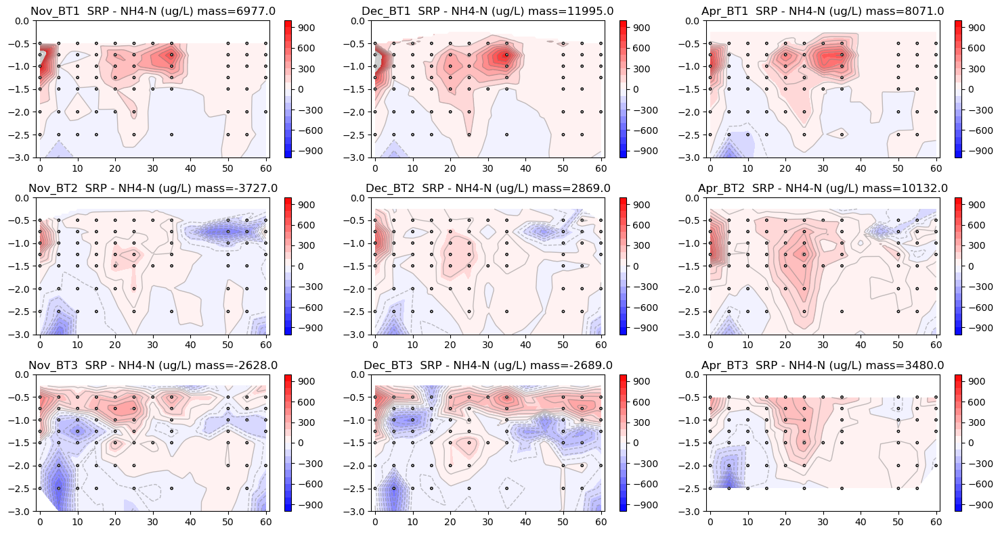

1959.0

C:\Users\swan47\AppData\Local\Temp\ipykernel_37244\4142146717.py:51: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()
C:\Users\swan47\AppData\Local\Temp\ipykernel_37244\4142146717.py:114: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig2.show()


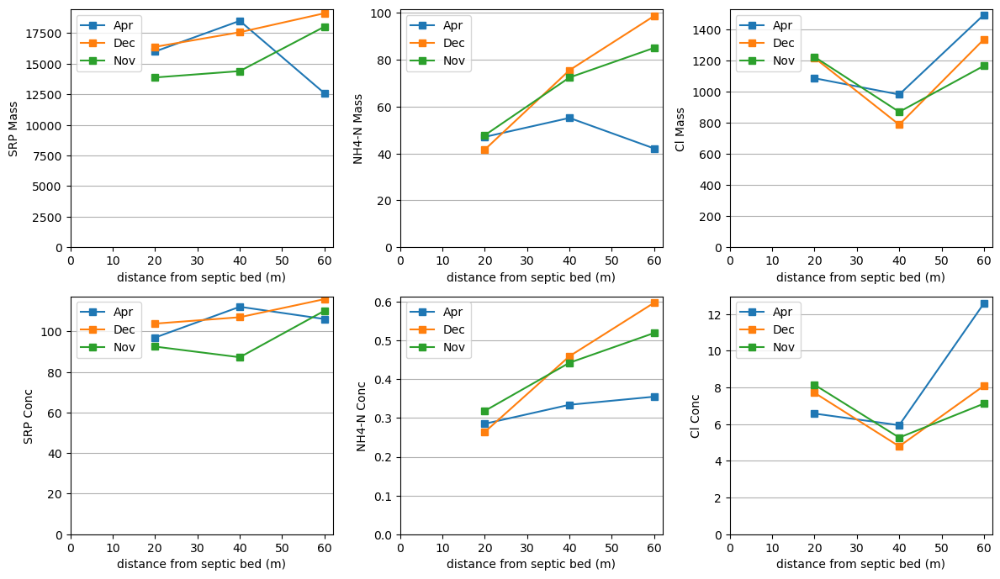

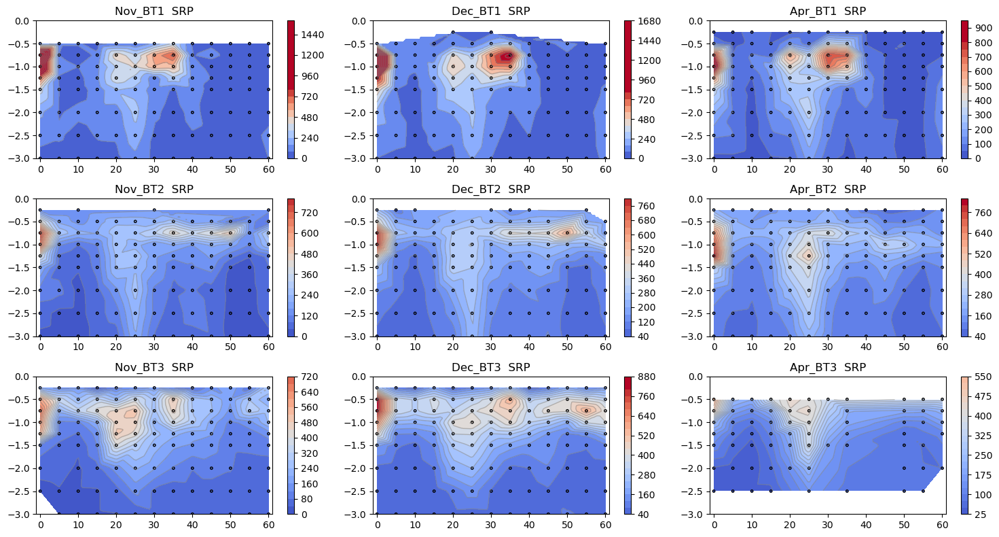

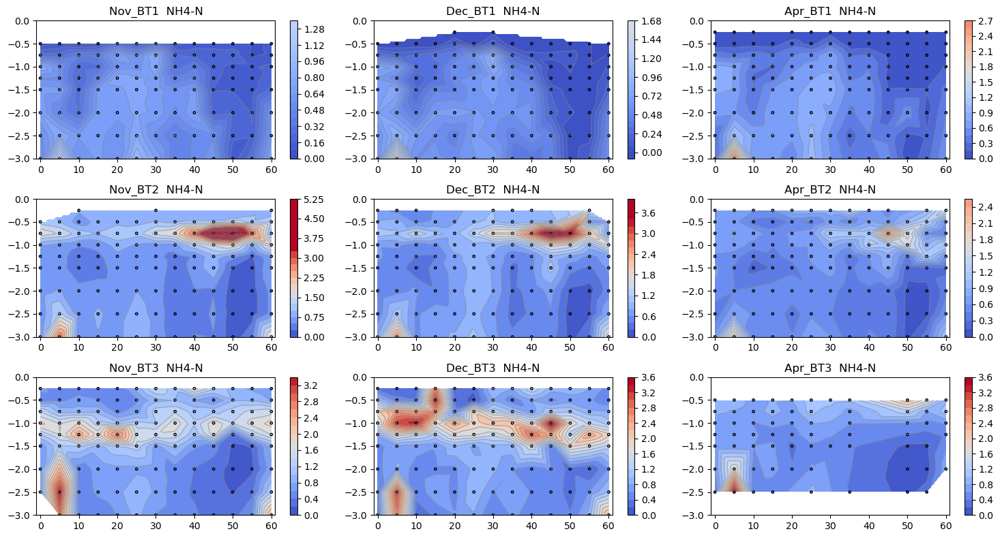

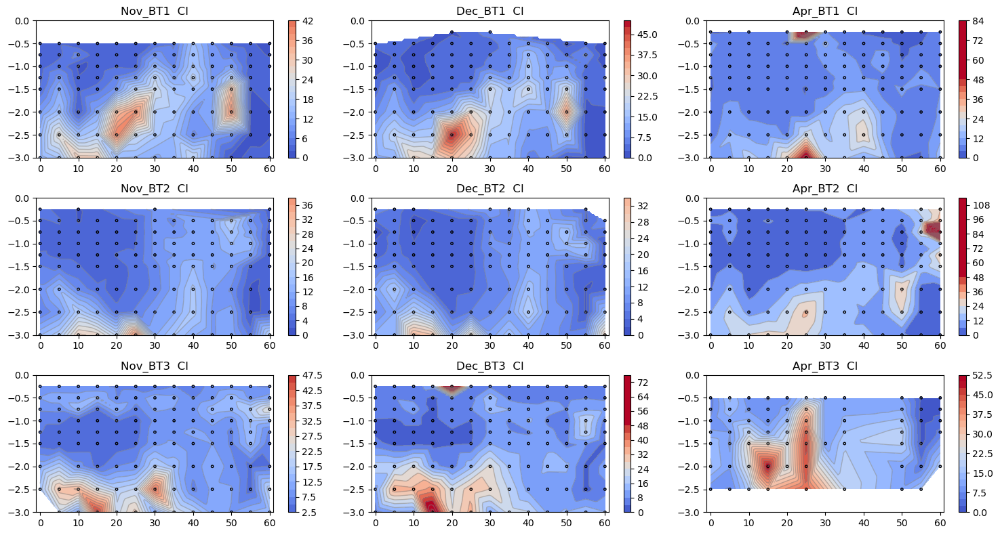

In [8]:
import numpy as np
from scipy.interpolate import griddata
import matplotlib.pyplot as plt

fig2 ,ax2 = plt.subplots(2,3)
n2 = 0

for parm in ['SRP', 'NH4-N','Cl','NO3','SO4']:
    vmin = np.nanmin([np.nanmin(raw_data[key][parm]) for key in raw_data.keys()])
    vmin = 0
    vmax = np.nanpercentile([np.nanmax(raw_data[key][parm]) for key in raw_data.keys()],50)

    grid_zs ={}
    fig,axes = plt.subplots(3,3)
    n = 0
    for sheet in sheet_names:
        df1 = raw_data[sheet].copy()
        df1 = df1[~df1[parm].isna()]
        xs = df1['x']
        ys = df1['y']
        zs = df1[parm]


        grid_x, grid_y = np.meshgrid(np.linspace(0, 60, 120), np.linspace(-3,0, 60))

        # Perform the kriging interpolation
        grid_z = griddata((xs, ys), zs, (grid_x, grid_y), method='linear')
        grid_zs[sheet] = grid_z


        # Plot the interpolated surface
        ax = axes.flatten()[n]
        n+=1
        #print(vmin,vmax)
        contour = ax.contourf(grid_x, grid_y, grid_z, cmap='coolwarm',levels=20,vmin=vmin,vmax=vmax)
        ax.contour(grid_x, grid_y, grid_z, levels=20, colors='grey', linewidths=1,alpha=0.5)
        ax.scatter(xs, ys, c=zs, cmap='coolwarm', edgecolors='k',s=6,vmin=vmin,vmax=vmax)
        
        #plt.colorbar()
        
        ax.set_ylim(-3.0,0)
        ax.set_xlim(-1,61)
        plt.colorbar(contour)
        
        #ax.title('2D Cubic Interpolation')
        ax.set_title('{}  {}'.format(sheet,parm))

    
    fig.set_size_inches(15,8)
    fig.tight_layout()
    fig.show()

    ##---------------------------------------


    ##---------------------------------------
    ax = ax2.flatten()[n2]
    
    for month in ['Apr','Dec','Nov']:
        grid_z = grid_zs['{}_BT1'.format(month)]
        y1 = np.nansum(grid_z[:,20:90]*0.025)

        grid_z = grid_zs['{}_BT2'.format(month)]
        y2 = np.nansum(grid_z[:,20:90]*0.025)

        grid_z = grid_zs['{}_BT3'.format(month)]
        y3 = np.nansum(grid_z[:,20:90]*0.025)

        ax.plot([20,40,60],[y1,y2,y3],marker='s',label=month)
    ax.set_ylim(0)
    ax.set_xlim(0)
    ax.grid(axis='y')
    ax.legend()
    
    ax.set_xlabel('distance from septic bed (m)')
    ax.set_ylabel('{} Mass'.format(parm))

    ## ---------- Concentration ----------
    ax = ax2.flatten()[n2+3]
    #n2 +=1
    for month in ['Apr','Dec','Nov']:
        grid_z = grid_zs['{}_BT1'.format(month)]
        area = len(grid_z[~np.isnan(grid_z)])*0.025
        #print(area)
        y1 = np.nansum(grid_z[:,20:90]*0.025)/area
        

        
        grid_z = grid_zs['{}_BT2'.format(month)]
        area = len(grid_z[~np.isnan(grid_z)])*0.025
        #print(area)
        y2 = np.nansum(grid_z[:,20:90]*0.025)/area


        
        grid_z = grid_zs['{}_BT3'.format(month)]
        area = len(grid_z[~np.isnan(grid_z)])*0.025
        #print(area)
        y3 = np.nansum(grid_z[:,20:90]*0.025)/area

        ax.plot([20,40,60],[y1,y2,y3],marker='s',label=month)
    ax.set_ylim(0)
    ax.set_xlim(0)
    ax.grid(axis='y')
    ax.legend()
    
    ax.set_xlabel('distance from septic bed (m)')
    ax.set_ylabel('{} Conc'.format(parm))
    n2 +=1


fig2.set_size_inches(12,7)
fig2.tight_layout()
fig2.show()
    

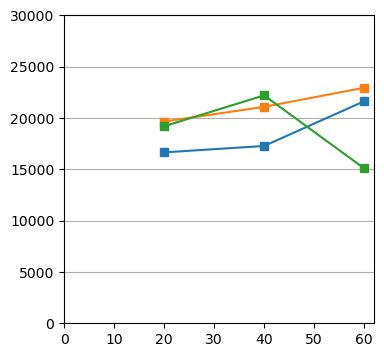

In [241]:
for month in ['Nov','Dec','Apr']:
    grid_z = grid_zs['{}_BT1'.format(month)]
    y1 = np.nansum(grid_z[:,20:45*2]*0.03)

    grid_z = grid_zs['{}_BT2'.format(month)]
    y2 = np.nansum(grid_z[:,20:45*2]*0.03)

    grid_z = grid_zs['{}_BT3'.format(month)]
    y3 = np.nansum(grid_z[:,20:45*2]*0.03)

    plt.plot([20,40,60],[y1,y2,y3],marker='s')
plt.ylim(0,30000)
plt.xlim(0)
plt.grid(axis='y')
plt.gcf().set_size_inches(4,4)
    

# Cations

In [280]:
cation_df = pd.read_excel('_imports/wasaga_cations.xlsx')
cation_df = cation_df[~cation_df['Fe'].isna()]

In [281]:
mask1 = cation_df['sample_name'].str.contains('BT1')
mask2 = cation_df['sample_name'].str.contains('BT2')
mask3 = cation_df['sample_name'].str.contains('BT3')

cation_df = cation_df[mask1 | mask2 |mask3]

In [282]:
cation_df.loc[:,'BT'] = cation_df['sample_name'].apply(lambda x: x.split('-')[1])


In [283]:
cation_df.loc[:,'x'] = cation_df['sample_name'].apply(lambda x: (int(x.split('-')[2])-1)*5)

In [284]:
cation_df.loc[:,'y'] = cation_df['sample_name'].apply(lambda x: x.split('-')[3])
cation_df.loc[:,'y'] = cation_df['y'].apply(lambda x: -float(x.split('m')[0]))

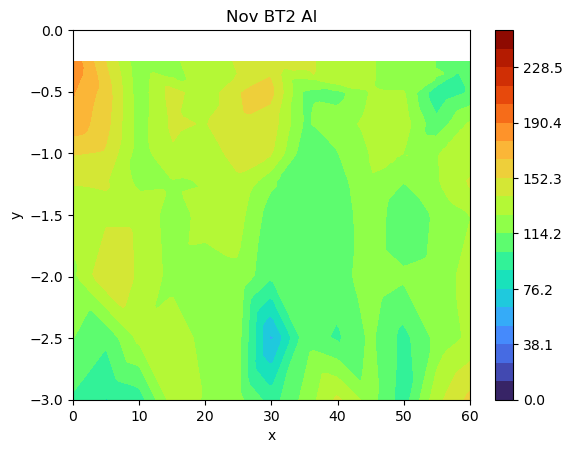

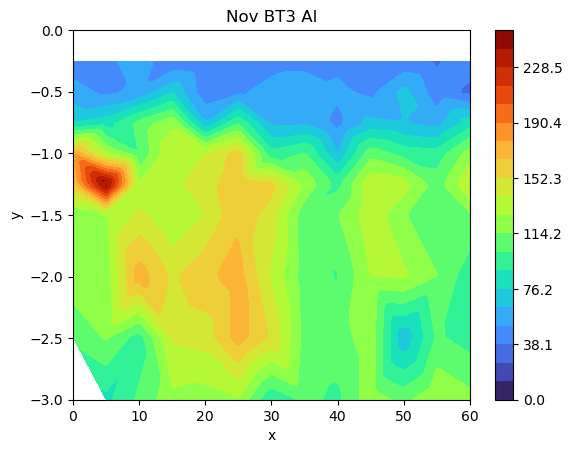

----------


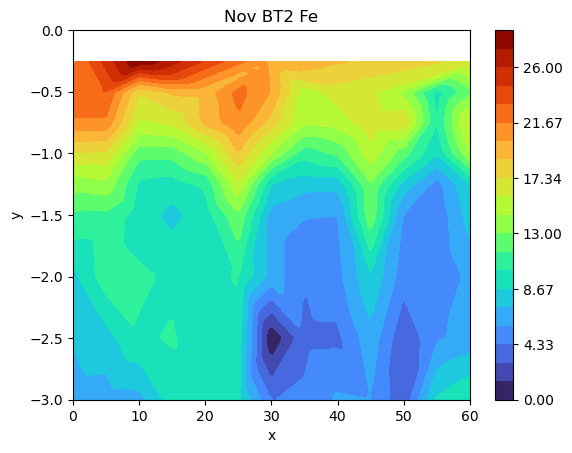

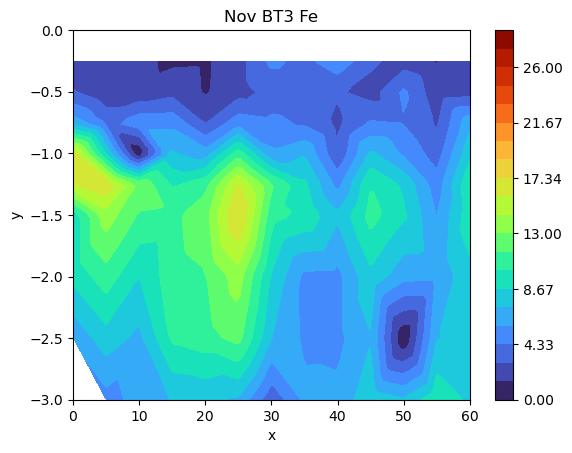

----------


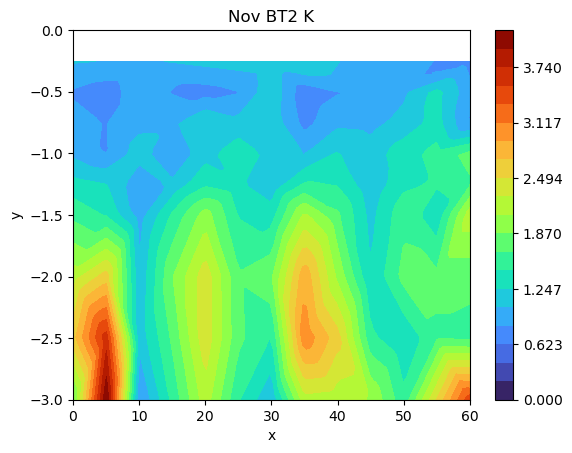

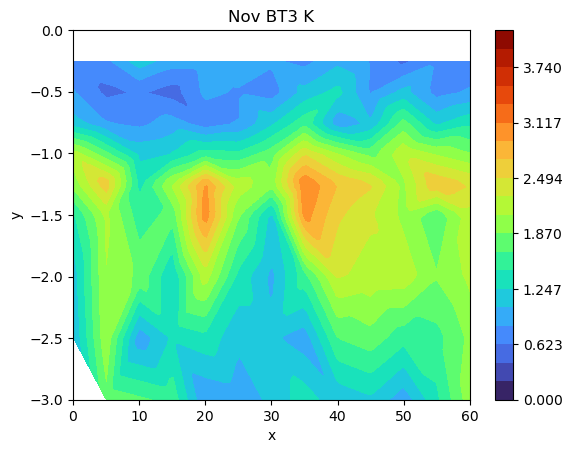

----------


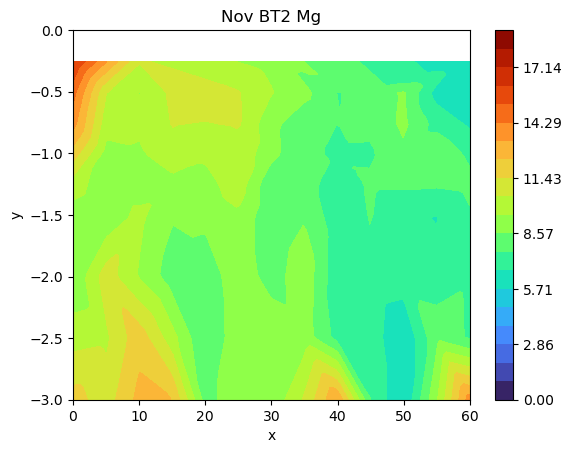

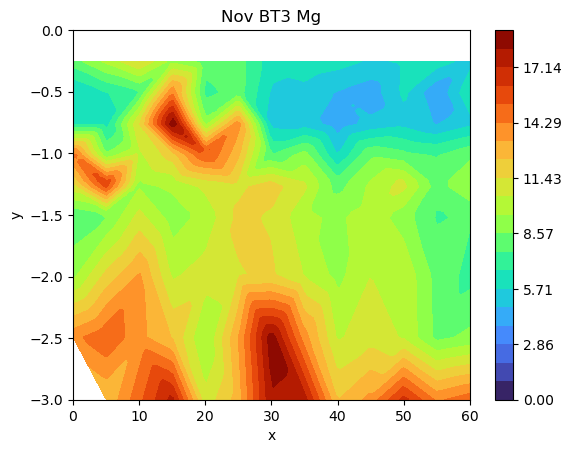

----------


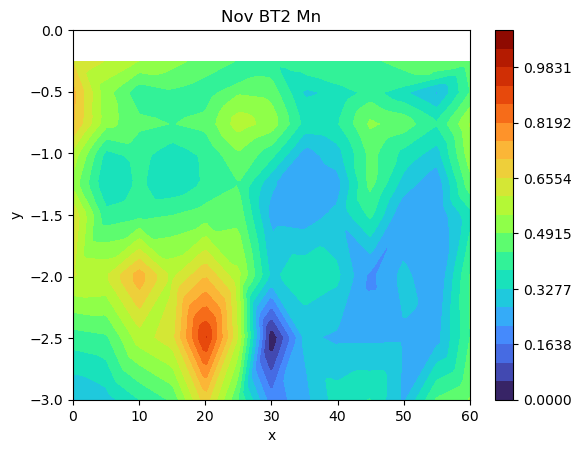

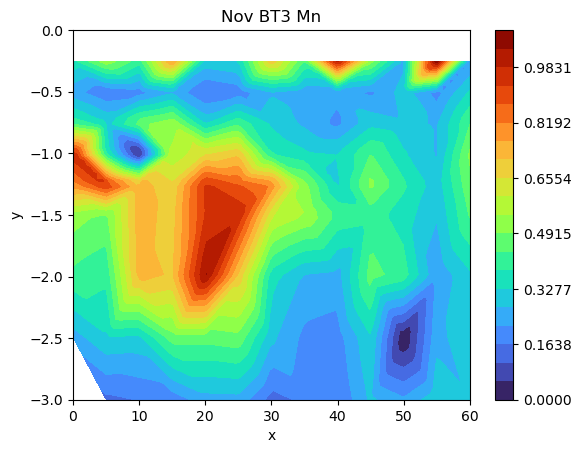

----------


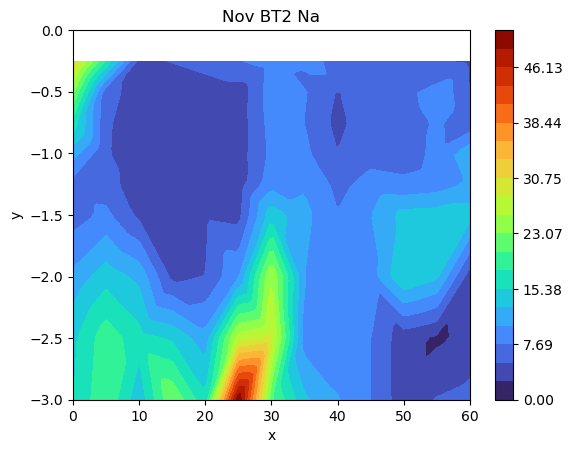

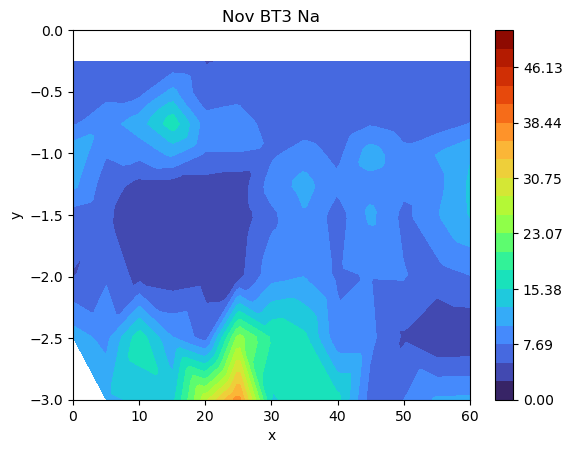

----------


In [291]:
from scipy.interpolate import griddata

for parm in ['Al','Fe','K','Mg','Mn','Na']:
    vmin = 0
    vmax = cation_df[parm].quantile(1)
    for bt in ['BT2','BT3']:
        df0 = cation_df[cation_df['BT']==bt]

        xs = df0['x']
        ys = df0['y']
        zs = df0[parm]
        
        grid_x, grid_y = np.meshgrid(np.linspace(0, 60, 120), np.linspace(-3,0, 60))
        grid_z = griddata((xs, ys), zs, (grid_x, grid_y), method='linear')

        # Create a contour plot
        #plt.tricontourf(x, y, z,cmap='turbo')
        plt.contourf(grid_x, grid_y, grid_z, cmap='turbo',levels=np.linspace(vmin,vmax,20+1),vmin=vmin,vmax=vmax)

 
        #
        cbar = plt.colorbar() 
        gap  = float("{0:.1g}".format((vmax-vmin)/12))
        #cbar.set_ticklabels([int(i) for i in np.arange(vmin, vmax + 1, gap)])


        #plt.scatter(x,y,c='k',s=4) 
        plt.xlabel('x')
        plt.ylabel('y')
        plt.title('Nov {} {}'.format(bt,parm))
        plt.ylim(-3,0)

        plt.show()
    print('----------')

In [170]:
[int(i) for i in np.arange(vmin, vmax + 1, gap)]

[0, 20, 40, 60, 80, 100, 120, 140, 160, 180, 200, 220, 240]